## Project - Concrete Strength Prediction

### Problem statement

#### Objective 

To predict the concrete strength using the data available in file "concrete.csv". Apply feature engineering and model tuning to obtain 85% to 95% accuracy.

 

##### Resources Available 

The data for this project is available in file https://archive.ics.uci.edu/ml/machine-learning-databases/concrete/compressive/. The same has been shared along with the course content.

 

#### Steps and Tasks:

Exploratory Data Quality Report Reflecting the Following:
<ul>
    <li>Univariate analysis – data types and description of the independent attributes which should include (name, range of values observed, central values (mean and median), standard deviation and quartiles, analysis of the body of distributions/tails, missing values, outliers, duplicates(10 Marks)</li>
    <li>Bi-variate analysis between the predictor variables and between the predictor variables and target column. Comment on your findings in terms of their relationship and degree of relation if any. Visualize the analysis using boxplots and pair plots, histograms, or density curves. (10 marks)</li>
    <li>Feature Engineering techniques(10 marks)
    <ul>
        <li>Identify opportunities (if any) to extract new features from existing features, drop a feature(if required) Hint: Feature Extraction, for example, consider a dataset with two features length and breadth. From this, we can extract a new feature Area which would be length * breadth.</li>
        <li>Get the data model ready and do a train test split.</li>
        <li>Decide on the complexity of the model, should it be a simple linear model in terms of parameters or would a quadratic or higher degree.</li>
        </ul>
    </li>
</li>
 
 
##### Creating the Model and Tuning It:
Algorithms that you think will be suitable for this project. Use Kfold Cross-Validation to evaluate model performance. Use appropriate metrics and make a DataFrame to compare models w.r.t their metrics. (at least 3 algorithms, one bagging and one boosting based algorithms have to be there). (15 marks)
Techniques employed to squeeze that extra performance out of the model without making it overfit. Use Grid Search or Random Search on any of the two models used above. Make a DataFrame to compare models after hyperparameter tuning and their metrics as above. (15 marks)
 

##### Attribute Information:

Given are the variable name, variable type, the measurement unit, and a brief description. The concrete compressive strength is the regression problem. The order of this listing corresponds to the order of numerals along the rows of the database.

 

Name	Data Type	Measurement	Description
1.	Cement (cement)	quantitative	kg in a m3 mixture	Input Variable
2.	Blast Furnace Slag (slag)	quantitative	kg in a m3 mixture	Input Variable
3.	Fly Ash (ash)	quantitative	kg in a m3 mixture	Input Variable
4.	Water(water)	quantitative	kg in a m3 mixture	Input Variable
5.	Superplasticizer (superplastic)	quantitative	kg in a m3 mixture	Input Variable
6.	Coarse Aggregate (coarseagg)	quantitative	kg in a m3 mixture	Input Variable
7.	Fine Aggregate (fineagg)	quantitative	kg in a m3 mixture	Input Variable
8.	Age(age)	quantitative	Day (1~365)	Input Variable
9.	Concrete compressive strength(strength)	quantitative	MPa	Output Variable


#### 1. Import the necessary packages

In [1]:
#Load Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import datetime
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings('ignore')

#### Read the dataset into dataframes

In [3]:
concrete_df = pd.read_csv("concrete.csv")
concrete_df.head(10)

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
0,141.3,212.0,0.0,203.5,0.0,971.8,748.5,28,29.89
1,168.9,42.2,124.3,158.3,10.8,1080.8,796.2,14,23.51
2,250.0,0.0,95.7,187.4,5.5,956.9,861.2,28,29.22
3,266.0,114.0,0.0,228.0,0.0,932.0,670.0,28,45.85
4,154.8,183.4,0.0,193.3,9.1,1047.4,696.7,28,18.29
5,255.0,0.0,0.0,192.0,0.0,889.8,945.0,90,21.86
6,166.8,250.2,0.0,203.5,0.0,975.6,692.6,7,15.75
7,251.4,0.0,118.3,188.5,6.4,1028.4,757.7,56,36.64
8,296.0,0.0,0.0,192.0,0.0,1085.0,765.0,28,21.65
9,155.0,184.0,143.0,194.0,9.0,880.0,699.0,28,28.99


In [4]:
concrete_df.tail(10)

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
1020,183.9,122.6,0.0,203.5,0.0,959.2,800.0,7,10.79
1021,203.5,305.3,0.0,203.5,0.0,963.4,630.0,3,9.56
1022,144.8,0.0,133.6,180.8,11.1,979.5,811.5,28,13.20
1023,141.3,212.0,0.0,203.5,0.0,971.8,748.5,7,10.39
1024,297.2,0.0,117.5,174.8,9.5,1022.8,753.5,3,21.91
1025,135.0,0.0,166.0,180.0,10.0,961.0,805.0,28,13.29
1026,531.3,0.0,0.0,141.8,28.2,852.1,893.7,3,41.30
1027,276.4,116.0,90.3,179.6,8.9,870.1,768.3,28,44.28
1028,342.0,38.0,0.0,228.0,0.0,932.0,670.0,270,55.06
1029,540.0,0.0,0.0,173.0,0.0,1125.0,613.0,7,52.61


#### Apply info, shape, describe, and find the number of missing values in the data 

In [5]:
# Check to see the number of records in the dataset
concrete_df.shape

(1030, 9)

#### Observation: The dataset comprises of 45211 rows and 17 columns

In [6]:
concrete_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1030 entries, 0 to 1029
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   cement        1030 non-null   float64
 1   slag          1030 non-null   float64
 2   ash           1030 non-null   float64
 3   water         1030 non-null   float64
 4   superplastic  1030 non-null   float64
 5   coarseagg     1030 non-null   float64
 6   fineagg       1030 non-null   float64
 7   age           1030 non-null   int64  
 8   strength      1030 non-null   float64
dtypes: float64(8), int64(1)
memory usage: 72.5 KB


In [7]:
concrete_df.dtypes

cement          float64
slag            float64
ash             float64
water           float64
superplastic    float64
coarseagg       float64
fineagg         float64
age               int64
strength        float64
dtype: object

In [8]:
# Check to see if data has any missing values
concrete_df.isnull().any()

cement          False
slag            False
ash             False
water           False
superplastic    False
coarseagg       False
fineagg         False
age             False
strength        False
dtype: bool

#### Observation: No Null Values are present 

In [9]:
#Analyze the distribution of the dataset
concrete_df.describe(include = 'all')

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
count,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000
mean,281.167864,73.895825,54.188350,181.567282,6.204660,972.918932,773.580485,45.662136,35.817961
std,104.506364,86.279342,63.997004,21.354219,5.973841,77.753954,80.175980,63.169912,16.705742
min,102.000000,0.000000,0.000000,121.800000,0.000000,801.000000,594.000000,1.000000,2.330000
25%,192.375000,0.000000,0.000000,164.900000,0.000000,932.000000,730.950000,7.000000,23.710000
50%,272.900000,22.000000,0.000000,185.000000,6.400000,968.000000,779.500000,28.000000,34.445000
75%,350.000000,142.950000,118.300000,192.000000,10.200000,1029.400000,824.000000,56.000000,46.135000
max,540.000000,359.400000,200.100000,247.000000,32.200000,1145.000000,992.600000,365.000000,82.600000


In [10]:
concrete_df.describe(include = 'all').transpose()

,count,mean,std,min,25%,50%,75%,max
cement,1030.0,281.167864,104.506364,102.00,192.375,272.900,350.000,540.0
slag,1030.0,73.895825,86.279342,0.00,0.000,22.000,142.950,359.4
ash,1030.0,54.188350,63.997004,0.00,0.000,0.000,118.300,200.1
water,1030.0,181.567282,21.354219,121.80,164.900,185.000,192.000,247.0
superplastic,1030.0,6.204660,5.973841,0.00,0.000,6.400,10.200,32.2
coarseagg,1030.0,972.918932,77.753954,801.00,932.000,968.000,1029.400,1145.0
fineagg,1030.0,773.580485,80.175980,594.00,730.950,779.500,824.000,992.6
age,1030.0,45.662136,63.169912,1.00,7.000,28.000,56.000,365.0
strength,1030.0,35.817961,16.705742,2.33,23.710,34.445,46.135,82.6


In [11]:
print(concrete_df.columns)

Index(['cement', 'slag', 'ash', 'water', 'superplastic', 'coarseagg',
       'fineagg', 'age', 'strength'],
      dtype='object')


In [12]:
num_cols = ['cement', 'slag', 'ash', 'water', 'superplastic', 'coarseagg', 'fineagg', 'age','strength']

Attribute:  cement
[{'mean': 281.16786407766995, 'iqr': 157.625, 'cilo': 265.18908102535397, 'cihi': 280.610918974646, 'whishi': 540.0, 'whislo': 102.0, 'fliers': array([], dtype=float64), 'q1': 192.375, 'med': 272.9, 'q3': 350.0}]


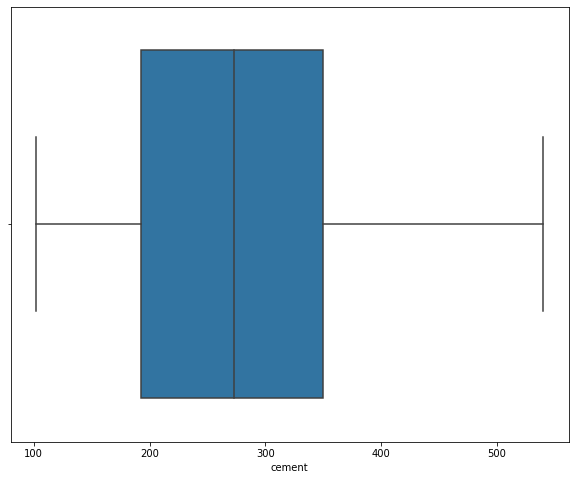

-------------------------------------------------------------------------
Attribute:  slag
[{'mean': 73.89582524271844, 'iqr': 142.95, 'cilo': 15.006973085325, 'cihi': 28.993026914675, 'whishi': 342.1, 'whislo': 0.0, 'fliers': array([359.4, 359.4]), 'q1': 0.0, 'med': 22.0, 'q3': 142.95}]


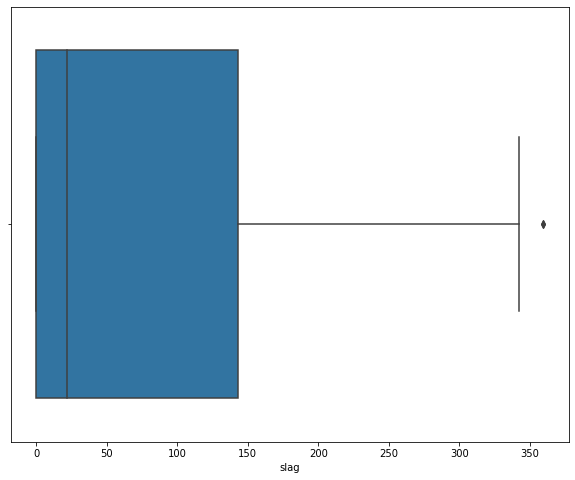

-------------------------------------------------------------------------
Attribute:  ash
[{'mean': 54.18834951456311, 'iqr': 118.3, 'cilo': -5.7871639314869, 'cihi': 5.7871639314869, 'whishi': 200.1, 'whislo': 0.0, 'fliers': array([], dtype=float64), 'q1': 0.0, 'med': 0.0, 'q3': 118.3}]


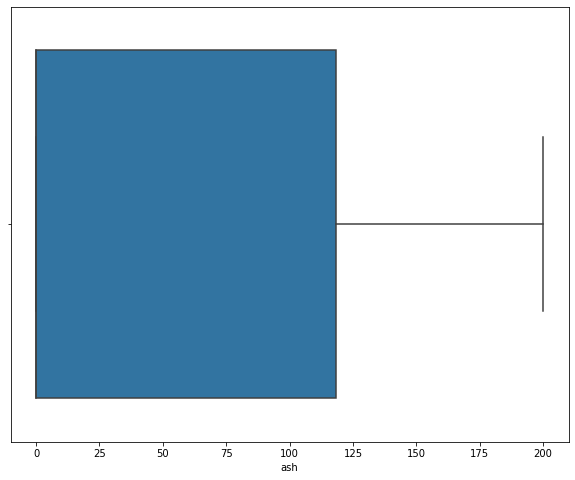

-------------------------------------------------------------------------
Attribute:  water
[{'mean': 181.56728155339806, 'iqr': 27.099999999999994, 'cilo': 183.67428450935506, 'cihi': 186.32571549064494, 'whishi': 228.0, 'whislo': 126.6, 'fliers': array([121.8, 121.8, 121.8, 121.8, 121.8, 247. , 246.9, 237. , 236.7]), 'q1': 164.9, 'med': 185.0, 'q3': 192.0}]


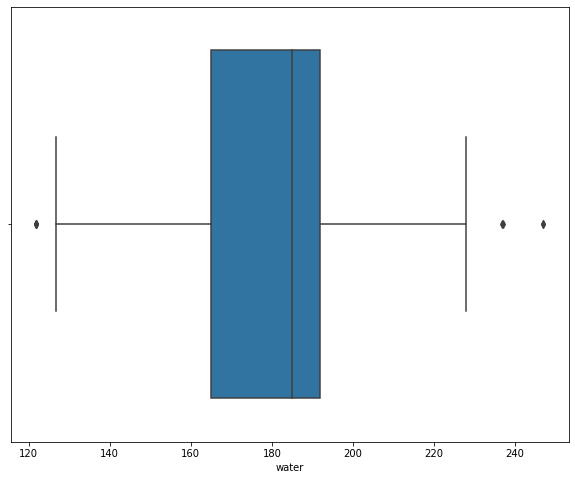

-------------------------------------------------------------------------
Attribute:  superplastic
[{'mean': 6.204660194174758, 'iqr': 10.2, 'cilo': 5.901022213853201, 'cihi': 6.8989777861468, 'whishi': 23.4, 'whislo': 0.0, 'fliers': array([28.2, 28.2, 32.2, 32.2, 28.2, 32.2, 32.2, 28.2, 32.2, 28.2]), 'q1': 0.0, 'med': 6.4, 'q3': 10.2}]


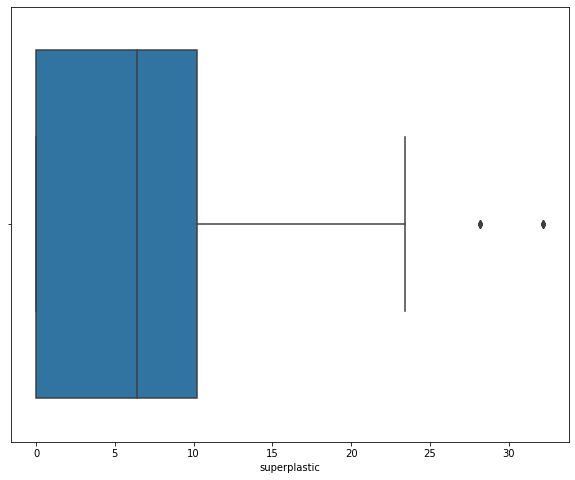

-------------------------------------------------------------------------
Attribute:  coarseagg
[{'mean': 972.9189320388349, 'iqr': 97.40000000000009, 'cilo': 963.235251336206, 'cihi': 972.764748663794, 'whishi': 1145.0, 'whislo': 801.0, 'fliers': array([], dtype=float64), 'q1': 932.0, 'med': 968.0, 'q3': 1029.4}]


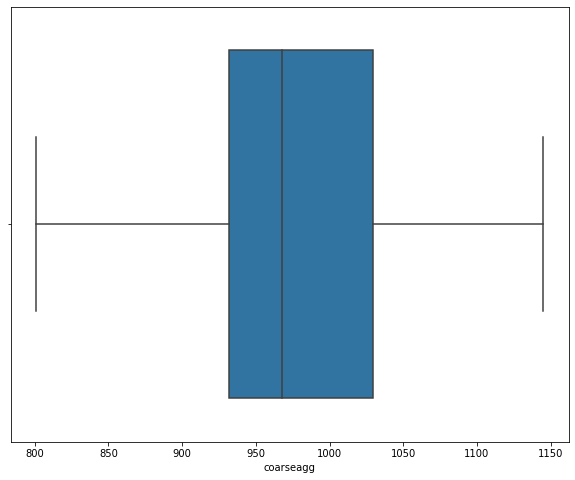

-------------------------------------------------------------------------
Attribute:  fineagg
[{'mean': 773.5804854368931, 'iqr': 93.05000000000007, 'cilo': 774.9480506861804, 'cihi': 784.0519493138196, 'whishi': 945.0, 'whislo': 594.0, 'fliers': array([992.6, 992.6, 992.6, 992.6, 992.6]), 'q1': 730.9499999999999, 'med': 779.5, 'q3': 824.0}]


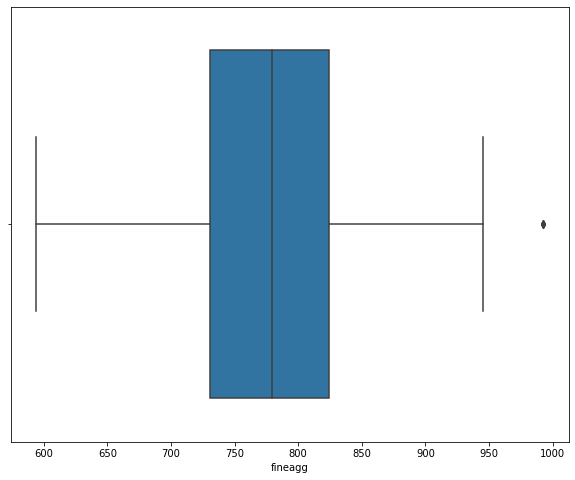

-------------------------------------------------------------------------
Attribute:  age
[{'mean': 45.662135922330094, 'iqr': 49.0, 'cilo': 25.602949850863414, 'cihi': 30.397050149136586, 'whishi': 120, 'whislo': 1, 'fliers': array([180, 365, 180, 180, 180, 365, 180, 270, 180, 360, 365, 365, 180,
       180, 270, 270, 270, 270, 180, 180, 270, 360, 180, 360, 180, 365,
       360, 365, 365, 180, 270, 180, 180, 365, 180, 180, 270, 270, 180,
       180, 365, 365, 180, 365, 360, 180, 270, 180, 270, 180, 365, 360,
       270, 365, 180, 180, 365, 180, 270]), 'q1': 7.0, 'med': 28.0, 'q3': 56.0}]


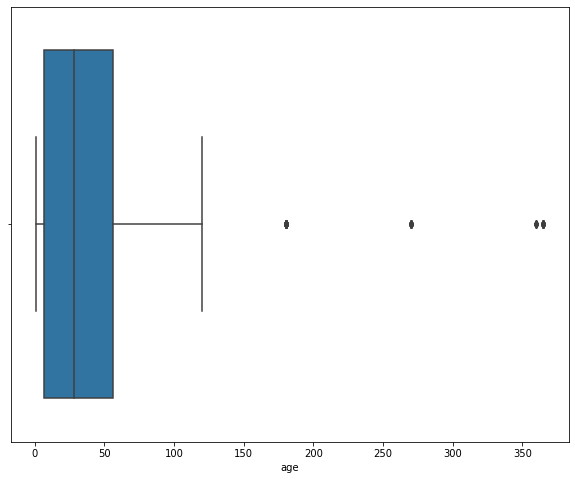

-------------------------------------------------------------------------
Attribute:  strength
[{'mean': 35.817961165048544, 'iqr': 22.425000000000008, 'cilo': 33.347982661339024, 'cihi': 35.542017338660976, 'whishi': 79.4, 'whislo': 2.33, 'fliers': array([81.75, 79.99, 82.6 , 80.2 ]), 'q1': 23.709999999999997, 'med': 34.445, 'q3': 46.135000000000005}]


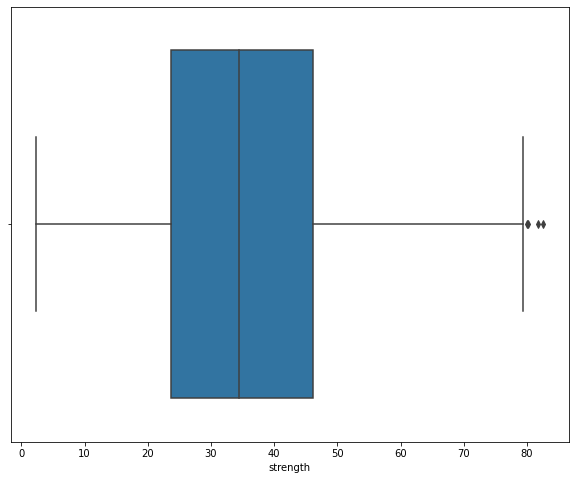

-------------------------------------------------------------------------


In [13]:
from matplotlib.cbook import boxplot_stats 

# Central tendency distribution 
i = 1
for col in num_cols:
    print('Attribute: ',col)
    print(boxplot_stats(concrete_df[col]))
    plt.figure(figsize=(10,8))
    sns.boxplot(concrete_df[col])
    plt.show();
    i = i+1
    print('-------------------------------------------------------------------------')

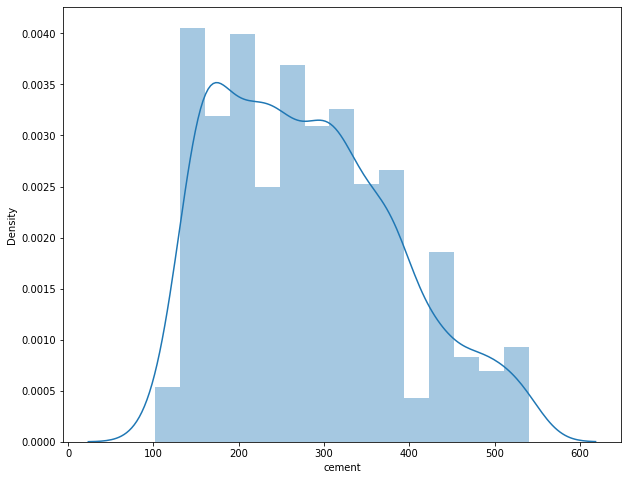

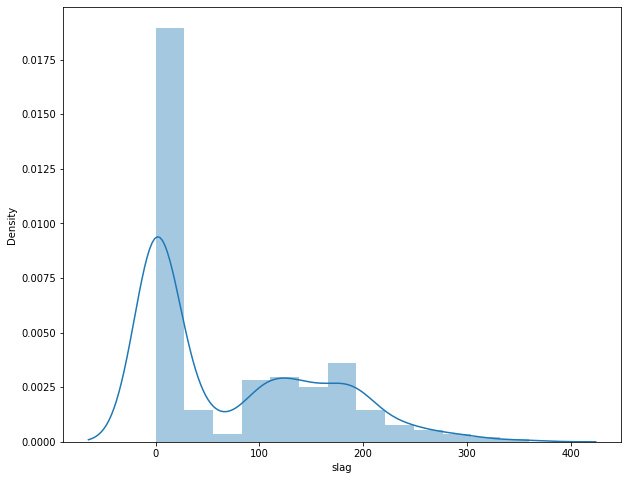

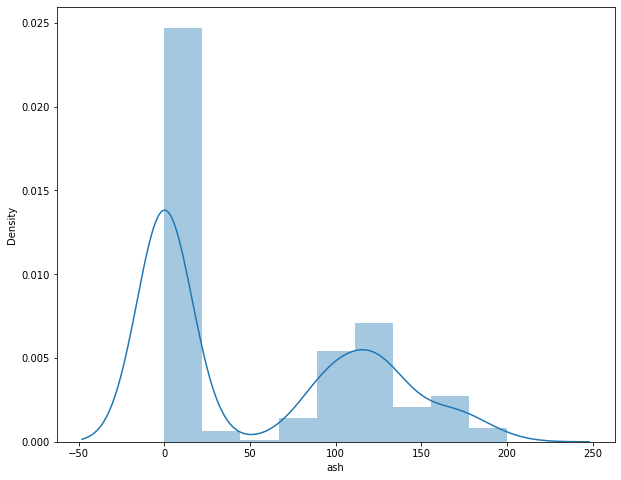

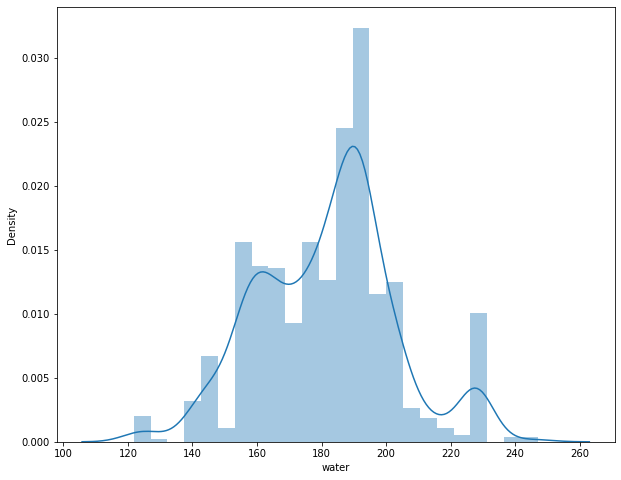

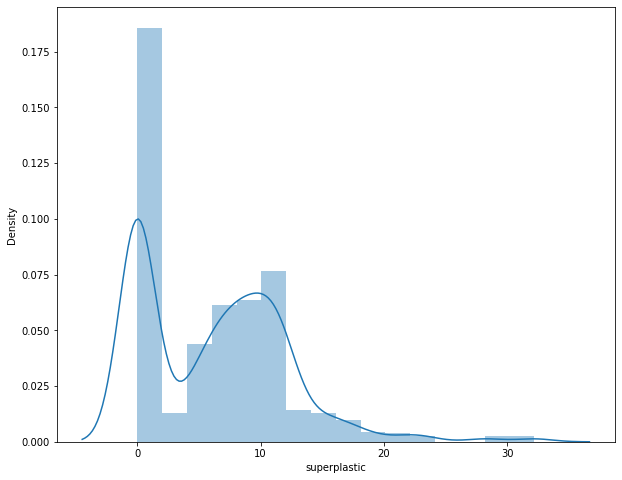

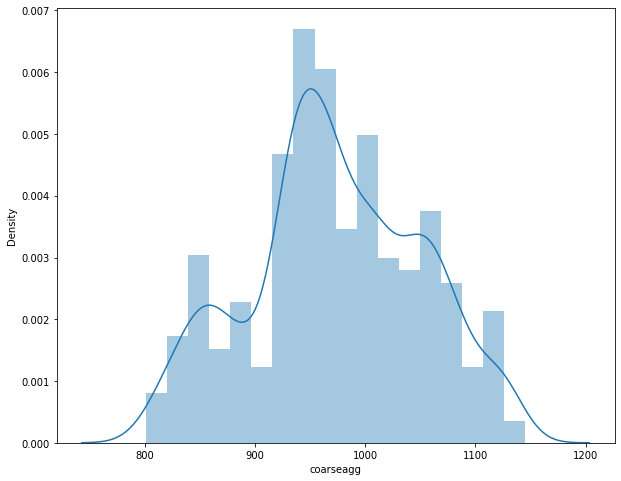

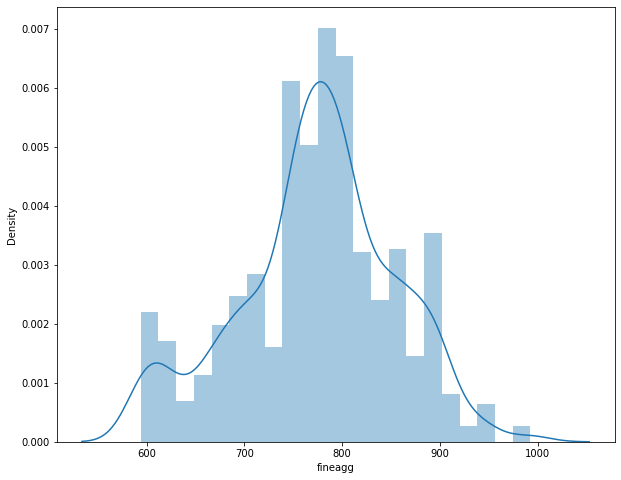

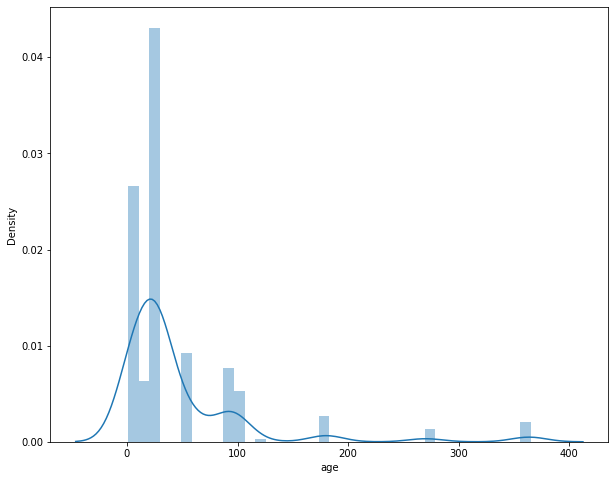

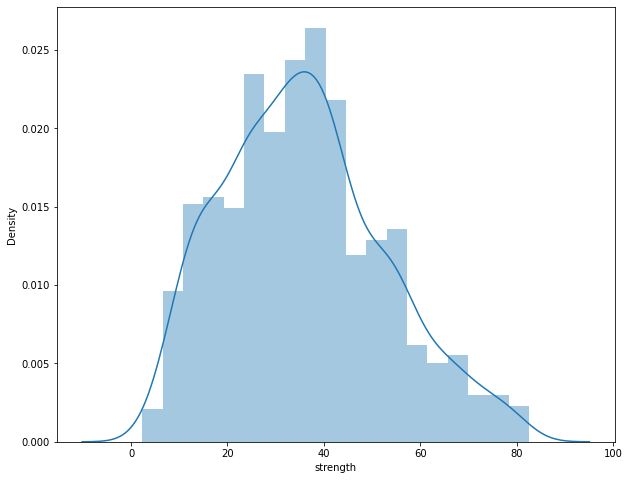

In [14]:
# Skewness distribution
i = 1
for col in num_cols:
    plt.figure(figsize=(10,8))
    sns.distplot(concrete_df[col])
    i = i+1

In [15]:
# Check the unique values in each column of the dataframe
concrete_df.nunique()

cement          278
slag            185
ash             156
water           195
superplastic    111
coarseagg       284
fineagg         302
age              14
strength        845
dtype: int64

In [16]:
import pandas_profiling
concrete_df.profile_report()

In [17]:
from pandas_profiling import ProfileReport

profile = ProfileReport(concrete_df, title="Pandas Profiling Report")
profile.to_widgets()

### Distribution of Target variable

In [18]:
concrete_df.strength.nunique()

845

In [19]:
concrete_df.strength.value_counts()

33.40    6
79.30    4
41.05    4
71.30    4
35.30    4
        ..
61.23    1
26.31    1
38.63    1
47.74    1
15.75    1
Name: strength, Length: 845, dtype: int64

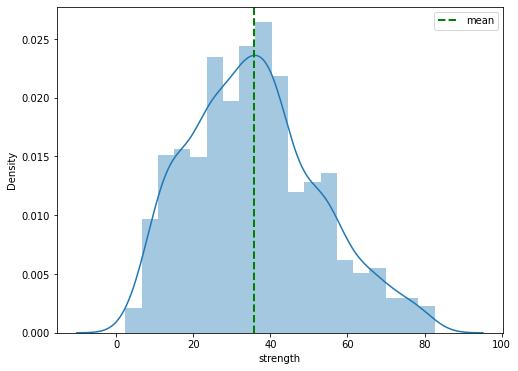

In [20]:
# Plot the distribution of the target attribute
plt.figure(figsize=(8,6))
sns.distplot(concrete_df['strength']);
plt.axvline(concrete_df['strength'].mean(), linestyle="dashed", color="g", label='mean', linewidth=2)
plt.legend(loc="best")
plt.show()

### Bivariate Analysis

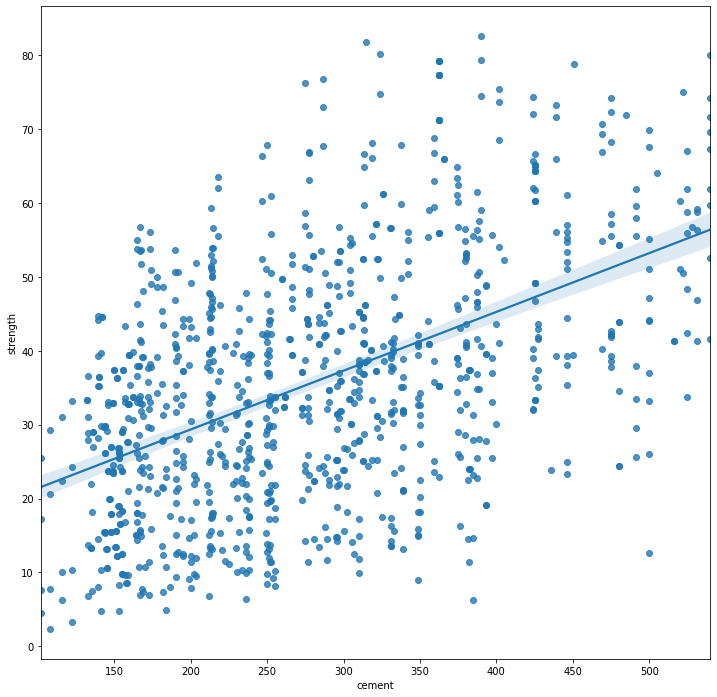

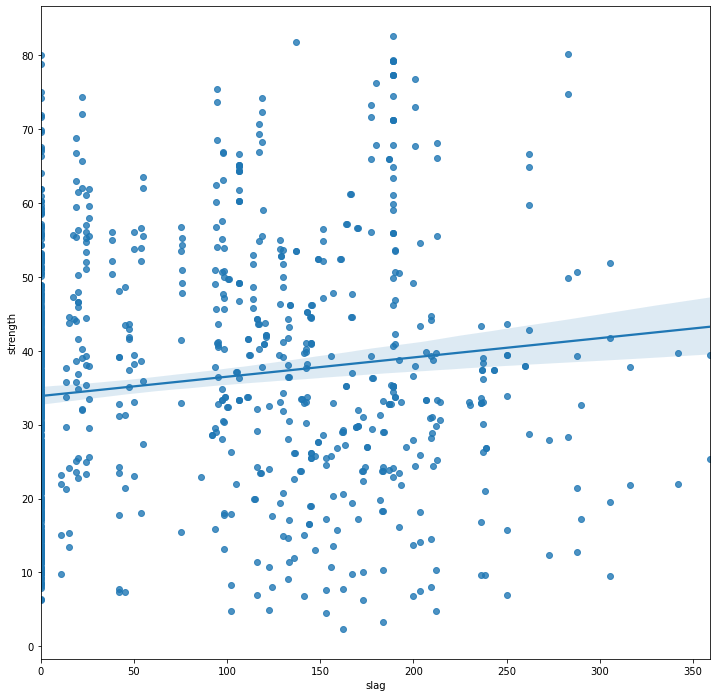

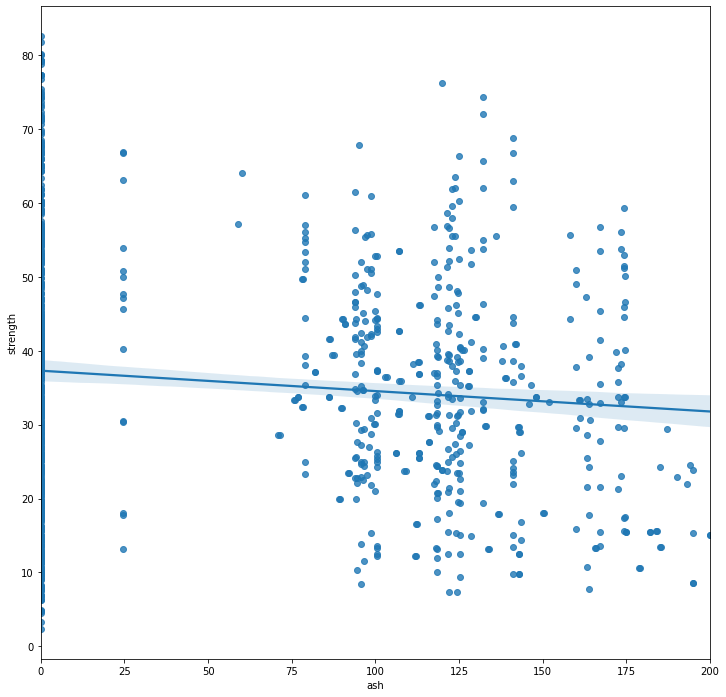

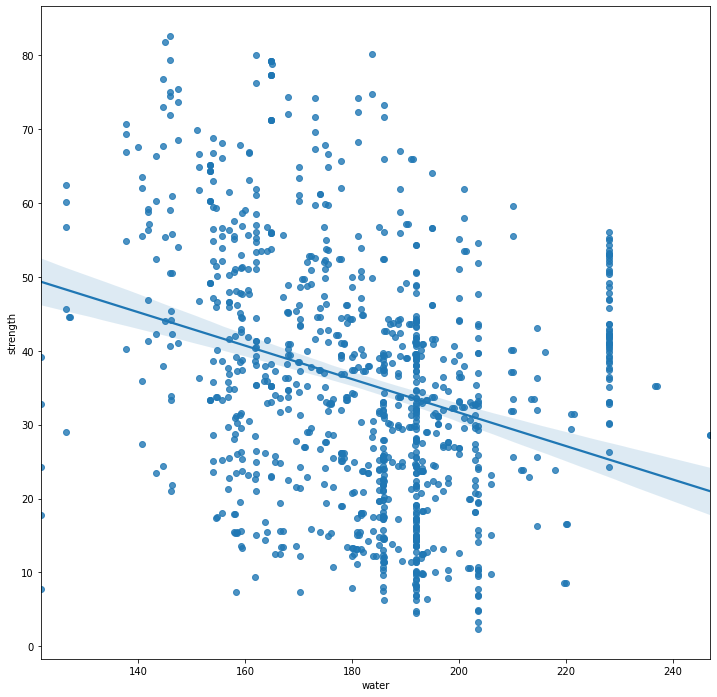

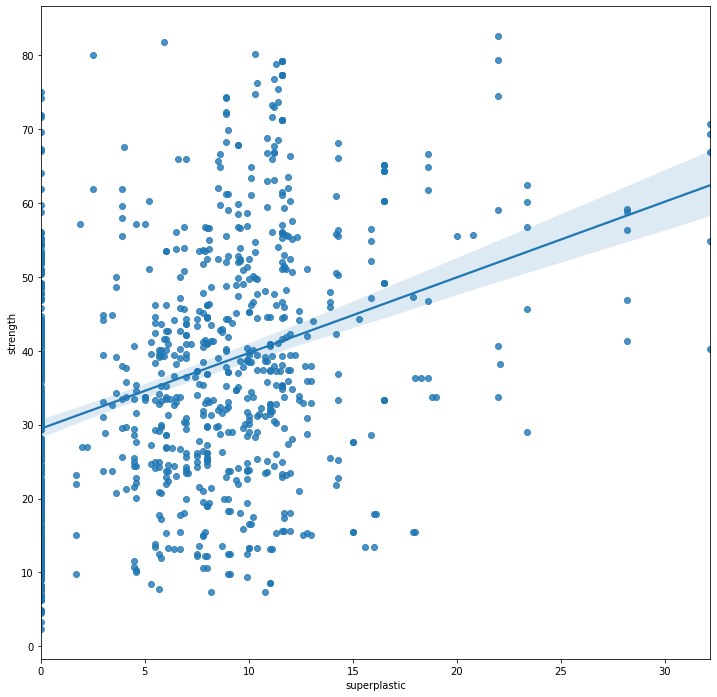

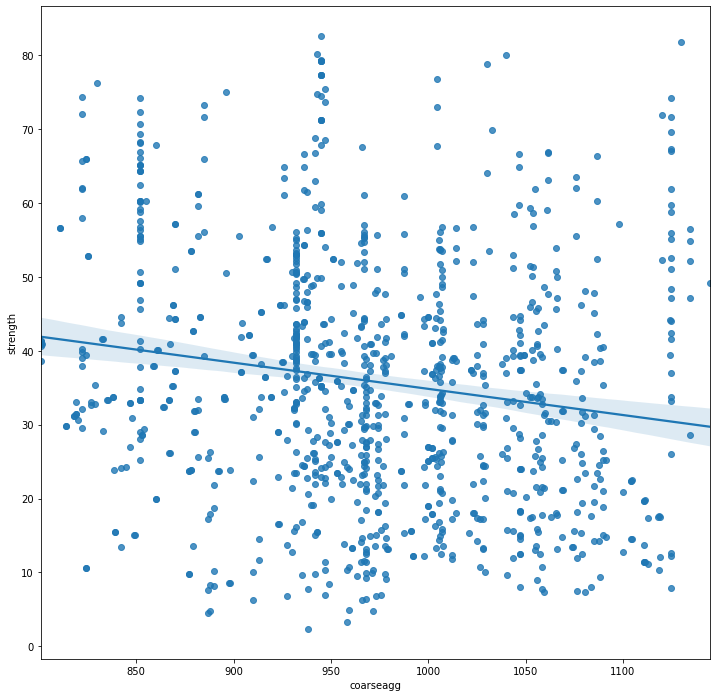

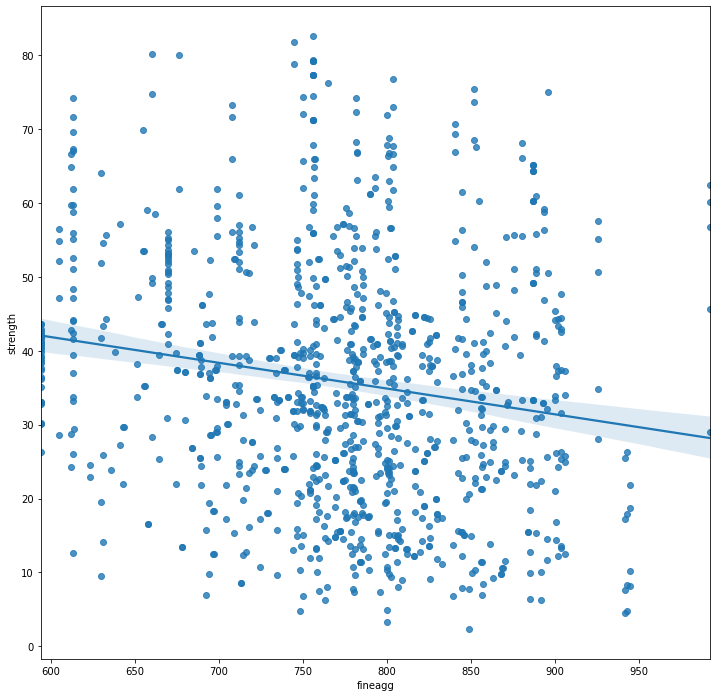

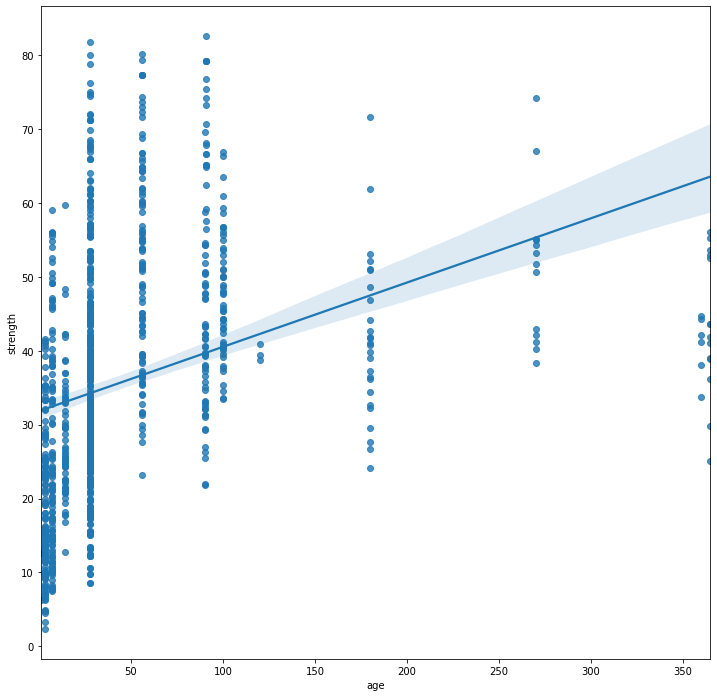

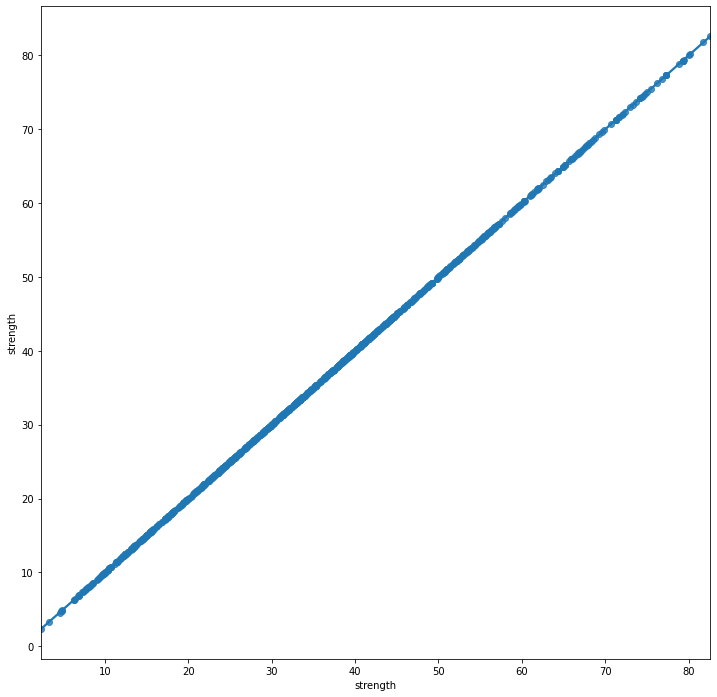

In [21]:
for col in num_cols:
    plt.figure(figsize=(12,12))
    ax = sns.regplot(x=col,y=concrete_df['strength'], data=concrete_df);

### Multivariate analysis

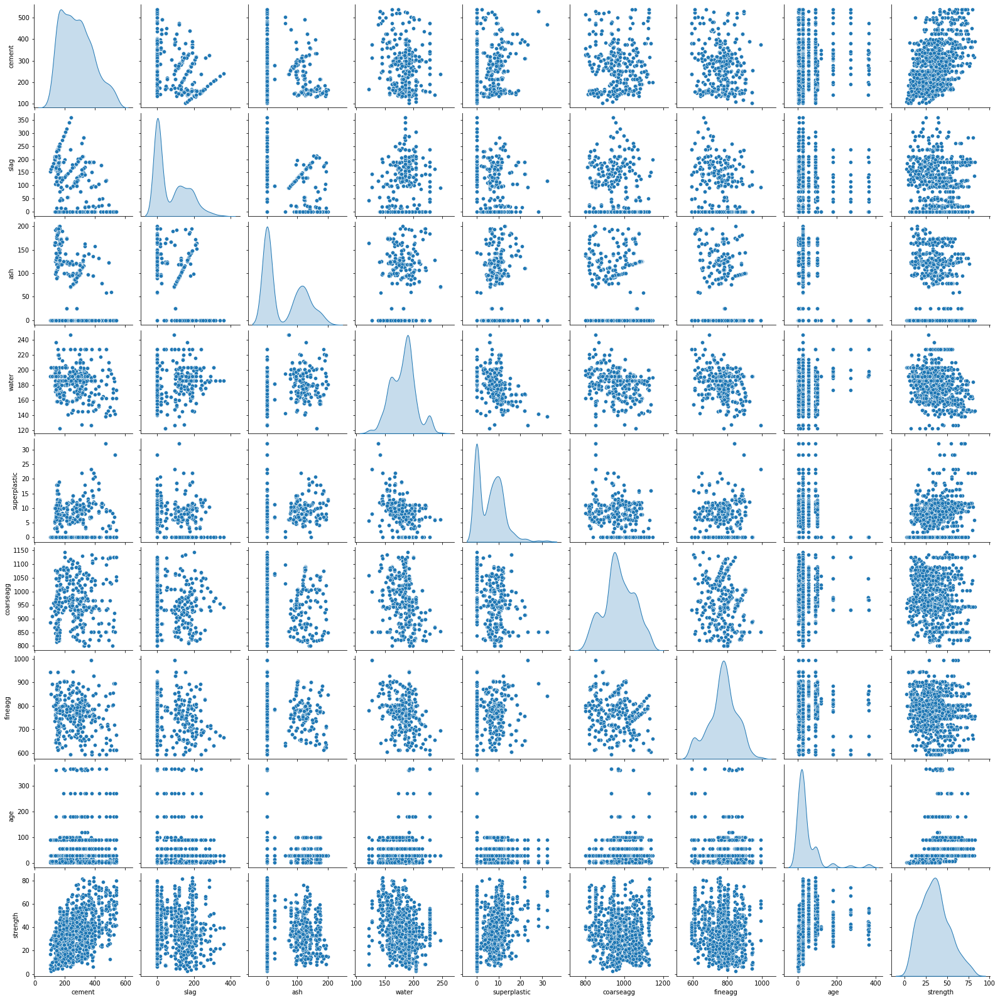

In [22]:
sns.pairplot(data = concrete_df,diag_kind ='kde');

In [23]:
# Correlation matrix 
corr = concrete_df.corr()
corr

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
cement,1.000000,-0.275216,-0.397467,-0.081587,0.092386,-0.109349,-0.222718,0.081946,0.497832
slag,-0.275216,1.000000,-0.323580,0.107252,0.043270,-0.283999,-0.281603,-0.044246,0.134829
ash,-0.397467,-0.323580,1.000000,-0.256984,0.377503,-0.009961,0.079108,-0.154371,-0.105755
water,-0.081587,0.107252,-0.256984,1.000000,-0.657533,-0.182294,-0.450661,0.277618,-0.289633
superplastic,0.092386,0.043270,0.377503,-0.657533,1.000000,-0.265999,0.222691,-0.192700,0.366079
coarseagg,-0.109349,-0.283999,-0.009961,-0.182294,-0.265999,1.000000,-0.178481,-0.003016,-0.164935
fineagg,-0.222718,-0.281603,0.079108,-0.450661,0.222691,-0.178481,1.000000,-0.156095,-0.167241
age,0.081946,-0.044246,-0.154371,0.277618,-0.192700,-0.003016,-0.156095,1.000000,0.328873
strength,0.497832,0.134829,-0.105755,-0.289633,0.366079,-0.164935,-0.167241,0.328873,1.000000


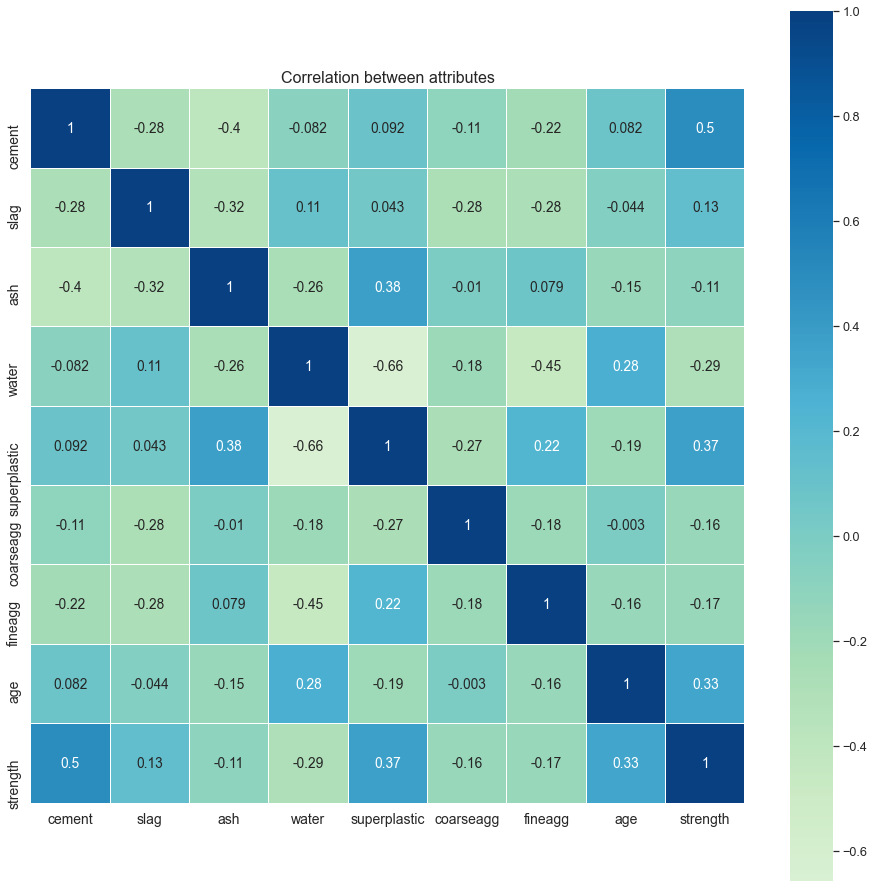

In [24]:
# Heatmap
sns.set(font_scale=1.15)
fig,ax=plt.subplots(figsize=(16,16))
sns.heatmap(corr, cmap='GnBu',annot=True,linewidths=0.01,center=0,linecolor='white',square=True)
plt.title('Correlation between attributes',fontsize=16)
ax.tick_params(labelsize=14)

<ul>
        <li> We can observe a high positive correlation between strength and cement </li> 
    <li> Also, age and superplastic are the other two factors influencing strength.</li>
    <li> A strong negative correlation exists between superplastic and water </li>
  <li> Positive correlations exist betweensSuperplastic and Fly Ash, Fine Aggregate </li> 
</ul>

In [25]:
# Identify duplicates records in the data
dupes = concrete_df.duplicated()
sum(dupes)

25

In [26]:
duplicate = concrete_df[concrete_df.duplicated()] 
print("Duplicate Rows :") 
duplicate

Duplicate Rows :


,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
278,425.0,106.3,0.0,153.5,16.5,852.1,887.1,3,33.40
298,425.0,106.3,0.0,153.5,16.5,852.1,887.1,3,33.40
400,362.6,189.0,0.0,164.9,11.6,944.7,755.8,3,35.30
420,362.6,189.0,0.0,164.9,11.6,944.7,755.8,3,35.30
463,362.6,189.0,0.0,164.9,11.6,944.7,755.8,56,77.30
468,252.0,0.0,0.0,185.0,0.0,1111.0,784.0,28,19.69
482,425.0,106.3,0.0,153.5,16.5,852.1,887.1,91,65.20
493,362.6,189.0,0.0,164.9,11.6,944.7,755.8,91,79.30
517,425.0,106.3,0.0,153.5,16.5,852.1,887.1,56,64.30
525,362.6,189.0,0.0,164.9,11.6,944.7,755.8,28,71.30


In [27]:
# Removing Duplicates
concrete_df = concrete_df.drop_duplicates()

In [28]:
dupes = concrete_df.duplicated()
sum(dupes)

0

In [29]:
# Check to see the number of records in the dataset
concrete_df.shape

(1005, 9)

In [30]:
Q1 = concrete_df.quantile(0.25)
Q3 = concrete_df.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

cement          158.30
slag            142.50
ash             118.30
water            26.30
superplastic     10.00
coarseagg        99.00
fineagg          97.90
age              49.00
strength         21.35
dtype: float64


In [31]:
np.where((concrete_df < (Q1 - 1.5 * IQR)) | (concrete_df > (Q3 + 1.5 * IQR)))

(array([  33,   44,   51,   64,   66,   93,   99,  103,  129,  129,  133,
         144,  149,  152,  156,  157,  159,  190,  192,  198,  199,  207,
         232,  245,  256,  257,  262,  263,  270,  291,  296,  300,  310,
         311,  321,  357,  359,  368,  391,  428,  443,  443,  444,  458,
         460,  477,  496,  496,  498,  527,  528,  559,  568,  571,  571,
         574,  581,  588,  606,  608,  609,  618,  628,  682,  699,  706,
         707,  718,  724,  728,  738,  739,  759,  772,  799,  809,  820,
         832,  839,  839,  843,  860,  879,  880,  893,  897,  898,  927,
         928,  932,  934,  947,  961,  966,  970,  978,  992, 1001, 1003]),
 array([3, 4, 7, 7, 3, 7, 7, 7, 3, 6, 7, 7, 7, 7, 4, 7, 7, 8, 8, 7, 7, 7,
        4, 8, 7, 8, 7, 3, 7, 4, 7, 7, 7, 7, 7, 7, 7, 7, 7, 3, 3, 6, 7, 3,
        7, 7, 3, 6, 8, 4, 7, 7, 7, 3, 6, 3, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7,
        7, 8, 3, 4, 7, 7, 7, 3, 4, 3, 4, 7, 3, 6, 7, 7, 7, 7, 3, 1, 7, 8,
        7, 4, 7, 7, 7, 1, 7, 8, 7, 4

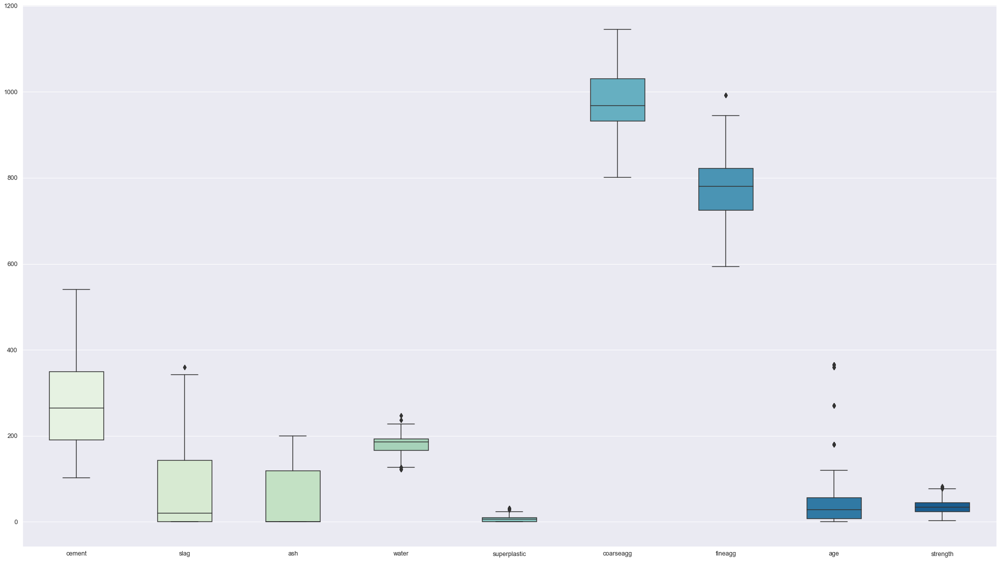

In [32]:
# Check for outliers in dataset using boxplot

fig,ax = plt.subplots(figsize=(35,20))
sns.boxplot(data=concrete_df,width=0.5,palette='GnBu',fliersize=7);

In [33]:
concrete_df_new = concrete_df.copy()

In [34]:
# Central tendency distribution 
i = 1
for col in num_cols:
    print('Attribute: ',col)
    Q1 = concrete_df[col].quantile(q=0.25)
    Q3 = concrete_df[col].quantile(q=0.75)
    lower_limit = Q1-1.5*(Q3-Q1)
    upper_limit = Q3+1.5*(Q3-Q1)
    print('Lower Limit: ', lower_limit)
    print('Upper Limit: ', upper_limit)
    outliers = len(concrete_df.loc[(concrete_df[col] < (lower_limit)) | (concrete_df[col] > (upper_limit))])
    print("Total number of Outliers:",outliers)
    i = i+1
    print('-------------------------------------------------------------------------')

Attribute:  cement
Lower Limit:  -46.75000000000003
Upper Limit:  586.45
Total number of Outliers: 0
-------------------------------------------------------------------------
Attribute:  slag
Lower Limit:  -213.75
Upper Limit:  356.25
Total number of Outliers: 2
-------------------------------------------------------------------------
Attribute:  ash
Lower Limit:  -177.45
Upper Limit:  295.75
Total number of Outliers: 0
-------------------------------------------------------------------------
Attribute:  water
Lower Limit:  127.14999999999998
Upper Limit:  232.35000000000002
Total number of Outliers: 15
-------------------------------------------------------------------------
Attribute:  superplastic
Lower Limit:  -15.0
Upper Limit:  25.0
Total number of Outliers: 10
-------------------------------------------------------------------------
Attribute:  coarseagg
Lower Limit:  783.5
Upper Limit:  1179.5
Total number of Outliers: 0
---------------------------------------------------------

<ul>
    <li> The attributes 'cement','ash' and 'coarseagg' has no outliers. </li>
    <li> Attributes 'superplastic' and 'strength' has mild outliers/outliers very close to the upper whisker of their corresponding boxplots and as such those outliers will not be treated and left as is. </li>
    <li> Same is the case with the lower end outliers for the attribute 'water' as they lie quite close to lower whisker of the boxplot and hence will not be treated. </li>
    <li> The attribute 'Age' has a varied range, different observations in age column are meant for allowing concrete to undergo rest for a wide range of observations and hence will not undergo outlier treatment. </li>
    <li> All the remaining outliers in the other attributes will be treated by capping them with min/max replacement. </li>
</ul>

In [35]:
out_cols = ['slag','water', 'fineagg']

In [36]:
#Replacing the outliers by Min/Max Replacement:
for col in out_cols:
    q1 = concrete_df_new[col].quantile(0.25)
    q3 = concrete_df_new[col].quantile(0.75)
    iqr = q3 - q1   
    min_val = q1-1.5*iqr
    max_val = q3+1.5*iqr
    concrete_df_new[col].loc[concrete_df_new[col] > max_val]  = max_val

In [37]:
concrete_df_new.shape, concrete_df.shape

((1005, 9), (1005, 9))

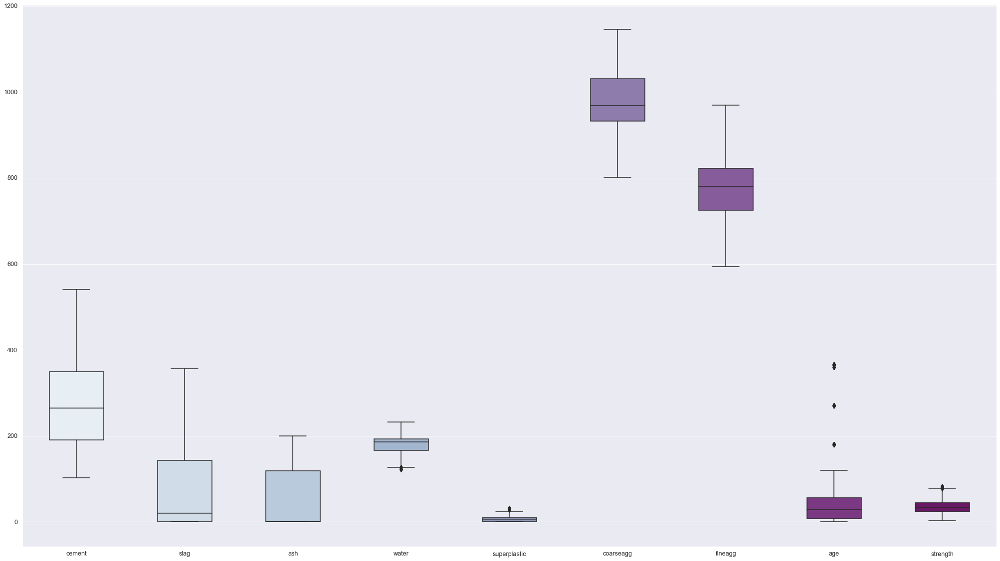

In [38]:
# Check for outliers in dataset using boxplot

fig,ax = plt.subplots(figsize=(35,20))
sns.boxplot(data=concrete_df_new,width=0.5,palette='BuPu',fliersize=7);

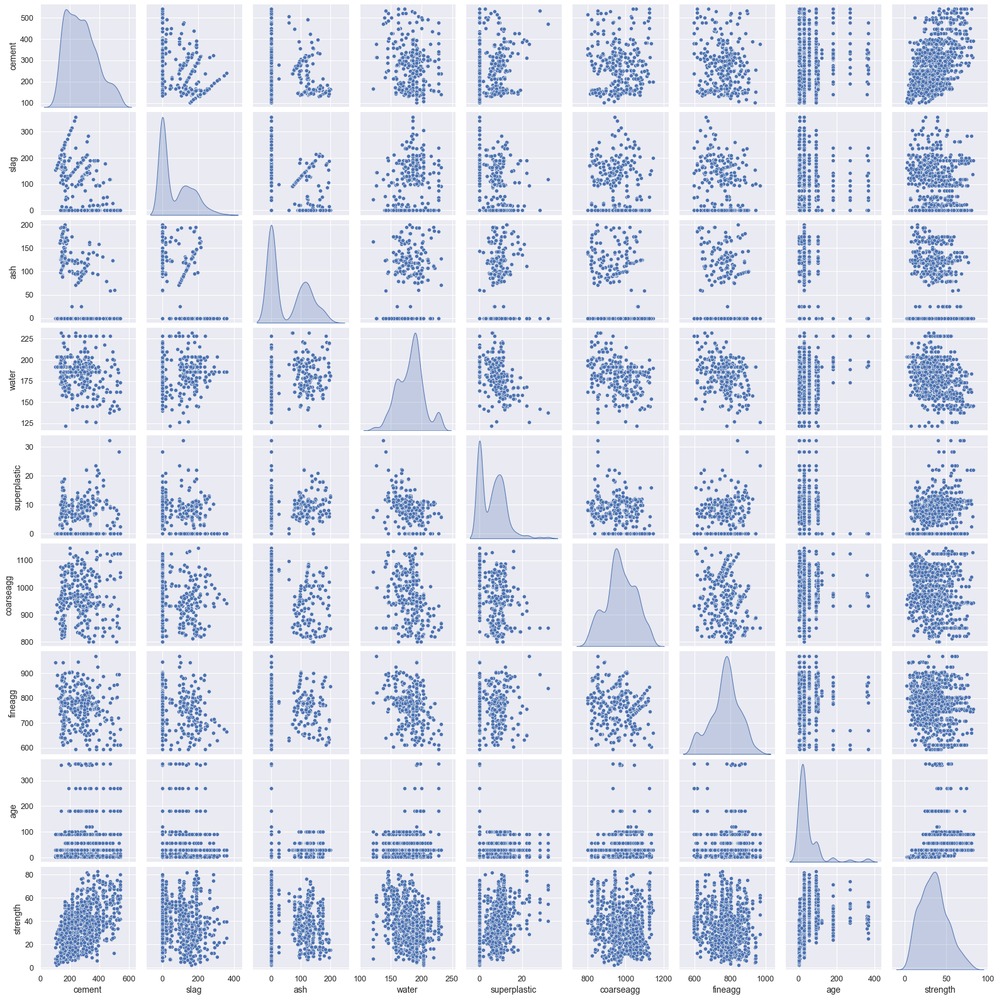

In [39]:
sns.pairplot(data = concrete_df_new,diag_kind ='kde');

####  Determining feature importance using pearson correlation matrix analysis

In [40]:
# Correlation matrix 
corr = concrete_df_new.corr()
corr

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
cement,1.000000,-0.303370,-0.385610,-0.055785,0.060906,-0.086205,-0.247662,0.086348,0.488283
slag,-0.303370,1.000000,-0.312365,0.130134,0.019879,-0.277595,-0.291129,-0.042737,0.103412
ash,-0.385610,-0.312365,1.000000,-0.285469,0.414213,-0.026468,0.091873,-0.158940,-0.080648
water,-0.055785,0.130134,-0.285469,1.000000,-0.650000,-0.210771,-0.442960,0.281111,-0.270347
superplastic,0.060906,0.019879,0.414213,-0.650000,1.000000,-0.241721,0.204485,-0.194076,0.344209
coarseagg,-0.086205,-0.277595,-0.026468,-0.210771,-0.241721,1.000000,-0.160494,-0.005264,-0.144717
fineagg,-0.247662,-0.291129,0.091873,-0.442960,0.204485,-0.160494,1.000000,-0.156965,-0.188558
age,0.086348,-0.042737,-0.158940,0.281111,-0.194076,-0.005264,-0.156965,1.000000,0.337367
strength,0.488283,0.103412,-0.080648,-0.270347,0.344209,-0.144717,-0.188558,0.337367,1.000000


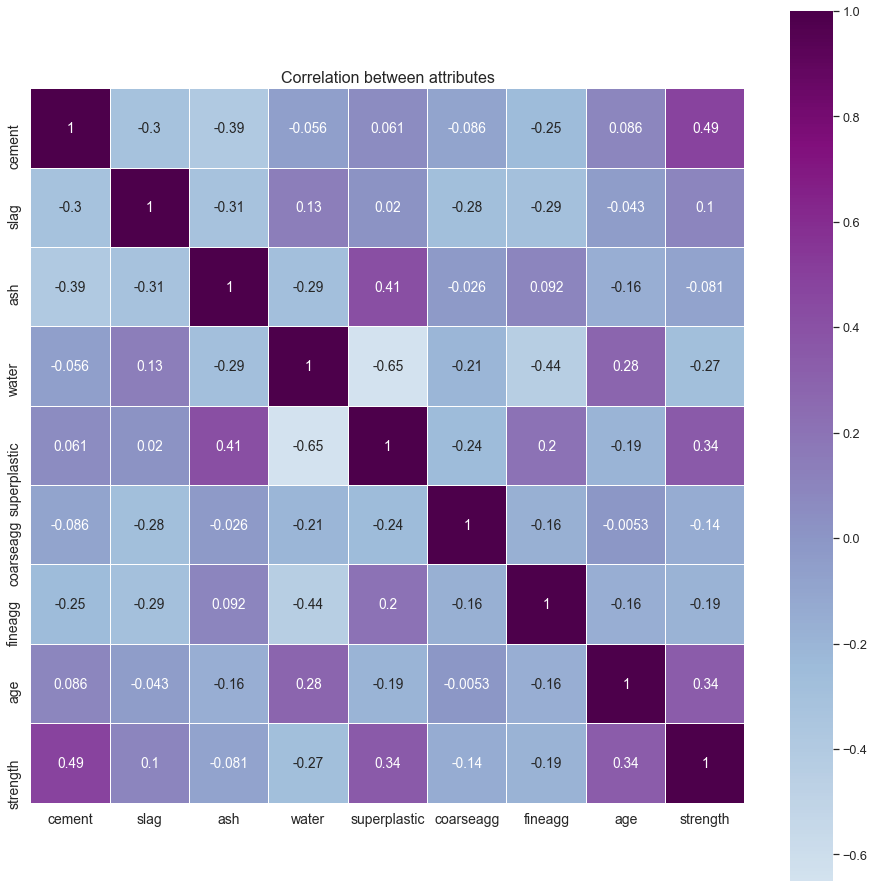

In [41]:
# Heatmap
sns.set(font_scale=1.15)
fig,ax=plt.subplots(figsize=(16,16))
sns.heatmap(corr, cmap='BuPu',annot=True,linewidths=0.01,center=0,linecolor='white',square=True)
plt.title('Correlation between attributes',fontsize=16)
ax.tick_params(labelsize=14)

In [42]:
target_corr = abs(corr['strength'])

#Selecting highly correlated features

rel_features = target_corr[target_corr>0.30]
rel_features

cement          0.488283
superplastic    0.344209
age             0.337367
strength        1.000000
Name: strength, dtype: float64

#### Relationship between indepndendent variables

In [43]:
print(concrete_df_new[["cement","superplastic"]].corr())

                cement  superplastic
cement        1.000000      0.060906
superplastic  0.060906      1.000000


In [44]:
print(concrete_df_new[["age","cement"]].corr())

             age    cement
age     1.000000  0.086348
cement  0.086348  1.000000


<ul>
    <li> From the pairplot and heatmap above it can be seen that the attributes fineagg,coarseagg, ash and slag have a very week relationship with the target attribute strength </li>
    <li>  Cement,water,age,superplastic attrbiutes are more reliable in predicting strength. </li></ul>

##  Model Building with Feature Selection/Elimination

In [45]:
#Scaling the dataset

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import KFold, cross_val_score
from sklearn import metrics
import numpy as np

std_scale = StandardScaler()
concrete_df_scaled = pd.DataFrame(std_scale.fit_transform(concrete_df_new),columns = concrete_df_new.columns)

In [46]:
# Dropping the least significant features

X = concrete_df_scaled.drop(['slag','ash','strength'], axis=1)
#X = concrete_df_scaled.drop(['slag','ash','strength','fineagg','coarseagg'], axis=1)
Y = concrete_df_scaled[['strength']]

In [47]:
# Split into training and test set
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3,random_state=1)

### Linear Regression with K-fold cross validation

In [48]:
from sklearn.metrics import confusion_matrix, recall_score, precision_score, f1_score, roc_auc_score,accuracy_score
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn.metrics import mean_squared_error, r2_score,mean_absolute_error

linreg = LinearRegression()

In [49]:
linreg_scores = cross_val_score(linreg, X_train, y_train, cv=KFold(10, random_state = 1,shuffle = True),scoring='neg_mean_squared_error')
linreg.fit(X_train, y_train) 
print(linreg.coef_)
print()

# Calculate the score of Linear Regression
print('Training score  :', linreg.score(X_train, y_train))
print('Testing score   :', linreg.score(X_test, y_test))

# Calculate average RMSE
print('RMSE:',np.sqrt(-(linreg_scores)).mean())

[[ 0.35150472 -0.52537907  0.07627982 -0.26146188 -0.30957404  0.40728199]]

Training score  : 0.5741143785995875
Testing score   : 0.5196393670639123
RMSE: 0.6768626077848419


In [50]:
#Store the results for each model in a dataframe for final comparison

results_df = pd.DataFrame({'Method':['Logistic Regression'],'Training Score': linreg.score(X_train, y_train).round(3),'Testing score': linreg.score(X_test, y_test).round(3),
                           'RMSE': np.sqrt(-(linreg_scores)).mean().round(3)})
results_df

,Method,Training Score,Testing score,RMSE
0,Logistic Regression,0.574,0.52,0.677


### Ridge Regression with K-fold cross validation

In [51]:
from sklearn.linear_model import Ridge

ridge = Ridge(alpha = 0.01,random_state=1)
ridge_scores = cross_val_score(ridge, X_train, y_train, cv=KFold(10, random_state = 1,shuffle = True), scoring='neg_mean_squared_error')
ridge.fit(X_train,y_train)
print ("Ridge model:", (ridge.coef_))
print()

# Calculate the score of Ridge Regressor
print('Training Score:',ridge.score(X_train, y_train))
print('Testing Score:',ridge.score(X_test, y_test))

# calculate the average RMSE
print('RMSE:',np.sqrt(-(ridge_scores)).mean())

Ridge model: [[ 0.35150834 -0.52534299  0.0763008  -0.26144217 -0.30955574  0.40727279]]

Training Score: 0.5741143781841784
Testing Score: 0.5196384607769541
RMSE: 0.6768620554324436


In [52]:
#Store the accuracy results for each model in a dataframe for final comparison

r_df = pd.DataFrame({'Method':['Ridge Regression'],'Training Score': ridge.score(X_train, y_train).round(3),'Testing score': ridge.score(X_test, y_test).round(3),
                           'RMSE': np.sqrt(-(ridge_scores)).mean().round(3)})
results_df = results_df.append(r_df)
results_df

,Method,Training Score,Testing score,RMSE
0,Logistic Regression,0.574,0.52,0.677
0,Ridge Regression,0.574,0.52,0.677


### Lasso Regression with K-fold cross validation

In [53]:
from sklearn.linear_model import Lasso

lasso = Lasso(alpha = 0.01,random_state=1)
lasso_scores = cross_val_score(lasso, X_train, y_train, cv=KFold(10, random_state = 1,shuffle = True), scoring='neg_mean_squared_error')
lasso.fit(X_train,y_train)
print ("Lasso model:", (lasso.coef_))
print()

# Calculate the score of Lasso Regressor
print('Training Score:',lasso.score(X_train, y_train))
print('Testing Score:',lasso.score(X_test, y_test))
# calculate the average RMSE
print('RMSE:',np.sqrt(-(lasso_scores)).mean())

Lasso model: [ 0.35443889 -0.48348782  0.0908796  -0.23408915 -0.28205163  0.39305517]

Training Score: 0.5732221938608163
Testing Score: 0.5181071566418518
RMSE: 0.677272758054042


In [54]:
#Store the accuracy results for each model in a dataframe for final comparison

r_df = pd.DataFrame({'Method':['Lasso Regression'],'Training Score': lasso.score(X_train, y_train).round(3),'Testing score': lasso.score(X_test, y_test).round(3),
                           'RMSE': np.sqrt(-(lasso_scores)).mean().round(3)})
results_df = results_df.append(r_df)
results_df

,Method,Training Score,Testing score,RMSE
0,Logistic Regression,0.574,0.520,0.677
0,Ridge Regression,0.574,0.520,0.677
0,Lasso Regression,0.573,0.518,0.677


### SVM Regression with K-fold cross validation

In [55]:
from sklearn.svm import SVR

svr = SVR()
svr_scores = cross_val_score(svr, X_train, y_train, cv=KFold(10, random_state = 1,shuffle = True), scoring='neg_mean_squared_error')
svr.fit(X_train, y_train)

SVR()

In [56]:
# Calculate the score of SVM Regressor

print('Training Score:',svr.score(X_train, y_train))
print('Testing Score:',svr.score(X_test, y_test))
# calculate the average RMSE
print('RMSE:',np.sqrt(-(svr_scores)).mean())

Training Score: 0.8468148799352222
Testing Score: 0.7734884588874045
RMSE: 0.45350428498605744


In [57]:
#Store the accuracy results for each model in a dataframe for final comparison

r_df = pd.DataFrame({'Method':['SVM Regression'],'Training Score': svr.score(X_train, y_train).round(3),'Testing score': svr.score(X_test, y_test).round(3),
                           'RMSE': np.sqrt(-(svr_scores)).mean().round(3)})
results_df = results_df.append(r_df)
results_df

,Method,Training Score,Testing score,RMSE
0,Logistic Regression,0.574,0.520,0.677
0,Ridge Regression,0.574,0.520,0.677
0,Lasso Regression,0.573,0.518,0.677
0,SVM Regression,0.847,0.773,0.454


### Decision Tree with K-fold cross validation

In [58]:
from sklearn.tree import DecisionTreeRegressor

dtree = DecisionTreeRegressor(random_state=1)
dtree_scores = cross_val_score(dtree, X_train, y_train, cv=KFold(10, random_state = 1,shuffle = True), scoring='neg_mean_squared_error')
dtree.fit(X_train, y_train)

DecisionTreeRegressor(random_state=1)

In [59]:
#Making the prediction
y_predict = dtree.predict(X_test)

In [60]:
print (pd.DataFrame(dtree.feature_importances_, columns = ["Imp"], index = X_train.columns))

                   Imp
cement        0.363611
water         0.130540
superplastic  0.047841
coarseagg     0.067936
fineagg       0.058126
age           0.331947


In [61]:
# Calculate the score of Decision Tree Regressor

print('Training Score:',dtree.score(X_train,y_train))
print('Testing Score:',dtree.score(X_test,y_test))
# calculate the average RMSE
print('RMSE:',np.sqrt(-(dtree_scores)).mean())

Training Score: 0.9956803039539844
Testing Score: 0.7258092524798596
RMSE: 0.4893316782431591


In [62]:
#Store the accuracy results for each model in a dataframe for final comparison

r_df = pd.DataFrame({'Method':['Decision Tree'],'Training Score': dtree.score(X_train, y_train).round(3),'Testing score': dtree.score(X_test, y_test).round(3),
                           'RMSE': np.sqrt(-(dtree_scores)).mean().round(3)})
results_df = results_df.append(r_df)
results_df

,Method,Training Score,Testing score,RMSE
0,Logistic Regression,0.574,0.520,0.677
0,Ridge Regression,0.574,0.520,0.677
0,Lasso Regression,0.573,0.518,0.677
0,SVM Regression,0.847,0.773,0.454
0,Decision Tree,0.996,0.726,0.489


Though the testing score has improved, there is quite a drop in accuracy from training score to testing score indicating this model is highly overfit and needs to be pruned.

### Pruned Decision Tree with K-fold cross validation

In [63]:
dtree_pruned = DecisionTreeRegressor(max_depth=6,random_state=1)
dtree_pruned_scores = cross_val_score(dtree_pruned, X_train, y_train, cv=KFold(10, random_state = 1,shuffle = True), scoring='neg_mean_squared_error')
dtree_pruned.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=6, random_state=1)

In [64]:
#Making the prediction
y_predict = dtree_pruned.predict(X_test)

In [65]:
# Calculate the score of Decision Tree Regressor

print('Training Score:',dtree_pruned.score(X_train,y_train))
print('Testing Score:',dtree_pruned.score(X_test,y_test))
# calculate the average RMSE
print('RMSE:',np.sqrt(-(dtree_pruned_scores)).mean())

Training Score: 0.8548704541731962
Testing Score: 0.7191732583382706
RMSE: 0.5231946259237826


In [66]:
#Store the accuracy results for each model in a dataframe for final comparison

r_df = pd.DataFrame({'Method':['Decision Tree with Pruning'],'Training Score': dtree_pruned.score(X_train, y_train).round(3),'Testing score': dtree_pruned.score(X_test, y_test).round(3),
                'RMSE': np.sqrt(-(dtree_pruned_scores)).mean().round(3)})
results_df = results_df.append(r_df)
results_df

,Method,Training Score,Testing score,RMSE
0,Logistic Regression,0.574,0.520,0.677
0,Ridge Regression,0.574,0.520,0.677
0,Lasso Regression,0.573,0.518,0.677
0,SVM Regression,0.847,0.773,0.454
0,Decision Tree,0.996,0.726,0.489
0,Decision Tree with Pruning,0.855,0.719,0.523


### Random Forest with K-fold cross validation

In [67]:
from sklearn.ensemble import RandomForestRegressor

rforest = RandomForestRegressor(random_state=1)
rforest_scores = cross_val_score(rforest, X_train, y_train, cv=KFold(10, random_state = 1,shuffle = True), scoring='neg_mean_squared_error')
rforest = rforest.fit(X_train, y_train)

In [68]:
y_predict = rforest.predict(X_test)

In [69]:
# Calculate the score of Random Forest Regressor

print('Training Score:',rforest.score(X_train,y_train))
print('Testing Score:',rforest.score(X_test,y_test))
# calculate the average RMSE
print('RMSE:',np.sqrt(-(rforest_scores)).mean())

Training Score: 0.9786069591610393
Testing Score: 0.8806792227114443
RMSE: 0.3735595250571718


Similar is the case with Random Forest regressor. Though the testing score has improved, there is quite a drop in accuracy from training score to testing score indicating this model is highly overfit and needs to be pruned.

In [70]:
#Store the accuracy results for each model in a dataframe for final comparison

r_df = pd.DataFrame({'Method':['Random Forest'],'Training Score': rforest.score(X_train, y_train).round(3),'Testing score': rforest.score(X_test, y_test).round(3),
                           'RMSE': np.sqrt(-(rforest_scores)).mean().round(3)})
results_df = results_df.append(r_df)
results_df

,Method,Training Score,Testing score,RMSE
0,Logistic Regression,0.574,0.520,0.677
0,Ridge Regression,0.574,0.520,0.677
0,Lasso Regression,0.573,0.518,0.677
0,SVM Regression,0.847,0.773,0.454
0,Decision Tree,0.996,0.726,0.489
0,Decision Tree with Pruning,0.855,0.719,0.523
0,Random Forest,0.979,0.881,0.374


### Pruned Random Forest with K-fold cross validation

In [71]:
reg_rforest = RandomForestRegressor(n_estimators = 50,max_depth = 7,min_samples_leaf=5,random_state=1)
reg_rforest_scores = cross_val_score(reg_rforest, X_train, y_train, cv=KFold(10, random_state = 1,shuffle = True), scoring='neg_mean_squared_error')
reg_rforest = reg_rforest.fit(X_train, y_train)

In [72]:
y_predict = reg_rforest.predict(X_test)

In [73]:
# Calculate the score of Random Forest Regressor

print('Training Score:',reg_rforest.score(X_train,y_train))
print('Testing Score:',reg_rforest.score(X_test,y_test))
# calculate the average RMSE
print('RMSE:',np.sqrt(-(reg_rforest_scores)).mean())

Training Score: 0.8993567229613707
Testing Score: 0.8237833727124787
RMSE: 0.4364360471215864


In [74]:
#Store the accuracy results for each model in a dataframe for final comparison

r_df = pd.DataFrame({'Method':['Random Forest with Pruning'],'Training Score': reg_rforest.score(X_train, y_train).round(3),'Testing score': reg_rforest.score(X_test, y_test).round(3),
                           'RMSE': np.sqrt(-(reg_rforest_scores)).mean().round(3)})
results_df = results_df.append(r_df)
results_df

,Method,Training Score,Testing score,RMSE
0,Logistic Regression,0.574,0.520,0.677
0,Ridge Regression,0.574,0.520,0.677
0,Lasso Regression,0.573,0.518,0.677
0,SVM Regression,0.847,0.773,0.454
0,Decision Tree,0.996,0.726,0.489
0,Decision Tree with Pruning,0.855,0.719,0.523
0,Random Forest,0.979,0.881,0.374
0,Random Forest with Pruning,0.899,0.824,0.436


### Bagging with K-fold cross validation

In [75]:
from sklearn.ensemble import BaggingRegressor

bag = BaggingRegressor(random_state=1)
bag_scores = cross_val_score(bag, X_train, y_train, cv=KFold(10, random_state = 1,shuffle = True), scoring='neg_mean_squared_error')
bag = bag.fit(X_train, y_train)

In [76]:
y_predict = bag.predict(X_test)

In [77]:
# Calculate the score of Bagging Regressor

print('Training Score:',bag.score(X_train,y_train))
print('Testing Score:',bag.score(X_test,y_test))
# calculate the average RMSE
print('RMSE:',np.sqrt(-(bag_scores)).mean())

Training Score: 0.9704545240413661
Testing Score: 0.8738546853107829
RMSE: 0.3968560493373133


In [78]:
#Store the accuracy results for each model in a dataframe for final comparison

r_df = pd.DataFrame({'Method':['Bagging'],'Training Score': bag.score(X_train, y_train).round(3),'Testing score': bag.score(X_test, y_test).round(3),
                           'RMSE': np.sqrt(-(bag_scores)).mean().round(3)})
results_df = results_df.append(r_df)
results_df

,Method,Training Score,Testing score,RMSE
0,Logistic Regression,0.574,0.520,0.677
0,Ridge Regression,0.574,0.520,0.677
0,Lasso Regression,0.573,0.518,0.677
0,SVM Regression,0.847,0.773,0.454
0,Decision Tree,0.996,0.726,0.489
0,Decision Tree with Pruning,0.855,0.719,0.523
0,Random Forest,0.979,0.881,0.374
0,Random Forest with Pruning,0.899,0.824,0.436
0,Bagging,0.970,0.874,0.397


### Bagging with SVR as base estimator

In [79]:
bag_svr = BaggingRegressor(base_estimator=SVR(),random_state=1)
bag_svr_scores = cross_val_score(bag_svr, X_train, y_train, cv=KFold(10, random_state = 1,shuffle = True), scoring='neg_mean_squared_error')
bag_svr.fit(X_train, y_train)

BaggingRegressor(base_estimator=SVR(), random_state=1)

In [80]:
y_predict = bag.predict(X_test)

In [81]:
# Calculate the score of Bagging Regressor

print('Training Score:',bag_svr.score(X_train,y_train))
print('Testing Score:',bag_svr.score(X_test,y_test))
# calculate the average RMSE
print('RMSE:',np.sqrt(-(bag_svr_scores)).mean())

Training Score: 0.8438337005697482
Testing Score: 0.7699479230460268
RMSE: 0.45898112374265737


In [82]:
#Store the accuracy results for each model in a dataframe for final comparison

r_df = pd.DataFrame({'Method':['Bagging with SVR'],'Training Score': bag_svr.score(X_train, y_train).round(3),'Testing score': bag_svr.score(X_test, y_test).round(3),
                           'RMSE': np.sqrt(-(bag_svr_scores)).mean().round(3)})
results_df = results_df.append(r_df)
results_df

,Method,Training Score,Testing score,RMSE
0,Logistic Regression,0.574,0.520,0.677
0,Ridge Regression,0.574,0.520,0.677
0,Lasso Regression,0.573,0.518,0.677
0,SVM Regression,0.847,0.773,0.454
0,Decision Tree,0.996,0.726,0.489
0,Decision Tree with Pruning,0.855,0.719,0.523
0,Random Forest,0.979,0.881,0.374
0,Random Forest with Pruning,0.899,0.824,0.436
0,Bagging,0.970,0.874,0.397
0,Bagging with SVR,0.844,0.770,0.459


### Gradient Boost with K-fold cross validation

In [83]:
from sklearn.ensemble import GradientBoostingRegressor

gboost = GradientBoostingRegressor(random_state=1)
gboost_scores = cross_val_score(gboost, X_train, y_train, cv=KFold(10, random_state = 1,shuffle = True), scoring='neg_mean_squared_error')
gboost = gboost.fit(X_train, y_train)

In [84]:
y_predict = gboost.predict(X_test)

In [85]:
# Calculate the score of Gradient Boost Regressor

print('Training Score:',gboost.score(X_train,y_train))
print('Testing Score:',gboost.score(X_test,y_test))
# calculate the average RMSE
print('RMSE:',np.sqrt(-(gboost_scores)).mean())

Training Score: 0.9271109209651247
Testing Score: 0.8594151347163341
RMSE: 0.37747865119298313


In [86]:
#Store the accuracy results for each model in a dataframe for final comparison

r_df = pd.DataFrame({'Method':['Gradient Boost'],'Training Score': gboost.score(X_train, y_train).round(3),'Testing score': gboost.score(X_test, y_test).round(3),
                           'RMSE': np.sqrt(-(gboost_scores)).mean().round(3)})
results_df = results_df.append(r_df)
results_df

,Method,Training Score,Testing score,RMSE
0,Logistic Regression,0.574,0.520,0.677
0,Ridge Regression,0.574,0.520,0.677
0,Lasso Regression,0.573,0.518,0.677
0,SVM Regression,0.847,0.773,0.454
0,Decision Tree,0.996,0.726,0.489
0,Decision Tree with Pruning,0.855,0.719,0.523
0,Random Forest,0.979,0.881,0.374
0,Random Forest with Pruning,0.899,0.824,0.436
0,Bagging,0.970,0.874,0.397
0,Bagging with SVR,0.844,0.770,0.459


### XGBoost with K-fold cross validation

In [87]:
import xgboost as xgb
from xgboost import XGBRegressor

xgboost = XGBRegressor(random_state=1)
xgboost_scores = cross_val_score(xgboost, X_train, y_train, cv=KFold(10, random_state = 1,shuffle = True), scoring='neg_mean_squared_error')
xgboost = xgboost.fit(X_train, y_train)

In [88]:
y_predict = xgboost.predict(X_test)

In [89]:
# Calculate the score of XGBoost Regressor

print('Training Score:',xgboost.score(X_train,y_train))
print('Testing Score:',xgboost.score(X_test,y_test))
# calculate the average RMSE
print('RMSE:',np.sqrt(-(xgboost_scores)).mean())

Training Score: 0.9950414464466165
Testing Score: 0.9083839481851465
RMSE: 0.3542115353296723


In [90]:
#Store the accuracy results for each model in a dataframe for final comparison

r_df = pd.DataFrame({'Method':['XGBoost'],'Training Score': xgboost.score(X_train, y_train).round(3),'Testing score': xgboost.score(X_test, y_test).round(3),
                           'RMSE': np.sqrt(-(xgboost_scores)).mean().round(3)})
results_df = results_df.append(r_df)
results_df

,Method,Training Score,Testing score,RMSE
0,Logistic Regression,0.574,0.520,0.677
0,Ridge Regression,0.574,0.520,0.677
0,Lasso Regression,0.573,0.518,0.677
0,SVM Regression,0.847,0.773,0.454
0,Decision Tree,0.996,0.726,0.489
0,Decision Tree with Pruning,0.855,0.719,0.523
0,Random Forest,0.979,0.881,0.374
0,Random Forest with Pruning,0.899,0.824,0.436
0,Bagging,0.970,0.874,0.397
0,Bagging with SVR,0.844,0.770,0.459


Random Forest, Gradient Boost and XGBoost Regressors seem to be the best suited models with higher accuracy and lower RMSE scores.  Let's tune the models and check for model performance at 95% confidence level.

### Model Tuning

### Hyperparameter Tuning - GridSearchCV - Random Forest

In [91]:
from pprint import pprint

print('Parameters currently in use:\n')
pprint(rforest.get_params())

Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'mse',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 1,
 'verbose': 0,
 'warm_start': False}


In [92]:
# Create the GridSearch estimator along with a parameter object containing the values to adjust
from sklearn.model_selection import GridSearchCV

n_estimators = [200, 500,1000,1800,2000]
max_features = ['auto','sqrt']
max_depth = [8,10,20,30,40,50]
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 5, 10] 

param_grid = dict(n_estimators = n_estimators, max_depth = max_depth,  
              min_samples_split = min_samples_split, max_features = max_features,
             min_samples_leaf = min_samples_leaf)

In [93]:
# Create grid search using 5-fold cross validation
clf = GridSearchCV(rforest, param_grid, cv=5,n_jobs = -1,verbose=2)

In [94]:
# Fit grid search
best_model = clf.fit(X_train, y_train)

Fitting 5 folds for each of 720 candidates, totalling 3600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   49.5s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 640 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 1005 tasks      | elapsed: 23.9min
[Parallel(n_jobs=-1)]: Done 1450 tasks      | elapsed: 34.3min
[Parallel(n_jobs=-1)]: Done 1977 tasks      | elapsed: 46.5min
[Parallel(n_jobs=-1)]: Done 2584 tasks      | elapsed: 58.6min
[Parallel(n_jobs=-1)]: Done 3273 tasks      | elapsed: 76.5min
[Parallel(n_jobs=-1)]: Done 3600 out of 3600 | elapsed: 84.5min finished


In [95]:
# View best hyperparameters
training_score = best_model.best_score_
print(best_model.best_score_)

print(best_model.best_params_)

# Actual model object fit with those best parameters
# Shows default parameters that we did not specify
print(best_model.best_estimator_)

0.8533651910631586
{'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 2000}
RandomForestRegressor(max_depth=20, max_features='sqrt', n_estimators=2000,
                      random_state=1)


In [96]:
# Apply best params to fit this model and see training scores

#clfg = RandomForestRegressor(random_state=1, max_depth=10, n_estimators=2000, max_features='sqrt',min_samples_leaf=1, min_samples_split=2)
clfg = best_model.best_estimator_
print("R Squared:",cross_val_score(clfg, X_train, y_train.values.ravel(), cv=10, scoring='r2').mean())

R Squared: 0.8693587930131738


In [97]:
clfg = clfg.fit(X_train, y_train.values.ravel())

In [98]:
test_RMSE = np.sqrt(mean_squared_error(y_test, clfg.predict(X_test)))
print("Test RMSE: ", np.sqrt(mean_squared_error(y_test, clfg.predict(X_test))))
test_score = r2_score(y_test, clfg.predict(X_test))
print("Test R^2: ", r2_score(y_test, clfg.predict(X_test)))

Test RMSE:  0.31836723650148213
Test R^2:  0.8844424531799839


In [99]:
#Store the accuracy results for each model in a dataframe for final comparison

r_df = pd.DataFrame({'Method':['Random Forest with GridSearch CV'],'Training Score': training_score.round(3),'Testing score': test_score.round(3),
                           'RMSE': test_RMSE})
results_df = results_df.append(r_df)
results_df

,Method,Training Score,Testing score,RMSE
0,Logistic Regression,0.574,0.520,0.677000
0,Ridge Regression,0.574,0.520,0.677000
0,Lasso Regression,0.573,0.518,0.677000
0,SVM Regression,0.847,0.773,0.454000
0,Decision Tree,0.996,0.726,0.489000
0,Decision Tree with Pruning,0.855,0.719,0.523000
0,Random Forest,0.979,0.881,0.374000
0,Random Forest with Pruning,0.899,0.824,0.436000
0,Bagging,0.970,0.874,0.397000
0,Bagging with SVR,0.844,0.770,0.459000


### Hyperparameter Tuning - RandomizedSearchCV - Random Forest

In [100]:
from sklearn.model_selection import RandomizedSearchCV

n_estimators = [200, 500,1000,1800,2000]
max_features = ['auto','sqrt']
max_depth = [8,10,20,30,40,50]
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 5, 10] 

param_grid = dict(n_estimators = n_estimators, max_depth = max_depth,  
              min_samples_split = min_samples_split, max_features = max_features,
             min_samples_leaf = min_samples_leaf)

In [101]:
# Create grid search using 5-fold cross validation
clf = RandomizedSearchCV(rforest, param_grid, cv=5, n_iter = 100,n_jobs = -1,verbose=2)

In [102]:
# Fit grid search
best_model = clf.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  9.9min finished


In [103]:
print('Best hyper parameter:', best_model.best_params_)

Best hyper parameter: {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 30}


In [104]:
# View best hyperparameters
training_score = best_model.best_score_
print(best_model.best_score_)

print(best_model.best_params_)

# Actual model object fit with those best parameters
# Shows default parameters that we did not specify
print(best_model.best_estimator_)

0.851449993890251
{'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 30}
RandomForestRegressor(max_depth=30, max_features='sqrt', n_estimators=200,
                      random_state=1)


In [105]:
# Apply best params to fit this model and see training scores

#clfg = RandomForestRegressor(random_state=1, max_depth=10, n_estimators=100, max_features='auto',min_samples_leaf=1, min_samples_split=2)
clfg = best_model.best_estimator_
print("R Squared:",cross_val_score(clfg, X_train, y_train.values.ravel(), cv=10, scoring='r2').mean())

R Squared: 0.8680577556201033


In [106]:
clfg = clfg.fit(X_train, y_train.values.ravel())

In [107]:
test_RMSE = np.sqrt(mean_squared_error(y_test, clfg.predict(X_test)))
print("Test RMSE: ", np.sqrt(mean_squared_error(y_test, clfg.predict(X_test))))
test_score = r2_score(y_test, clfg.predict(X_test))
print("Test R^2: ", r2_score(y_test, clfg.predict(X_test)))

Test RMSE:  0.3213775336560614
Test R^2:  0.8822468305891279


In [108]:
#Store the accuracy results for each model in a dataframe for final comparison

r_df = pd.DataFrame({'Method':['Random Forest with RandomSearch CV'],'Training Score': training_score.round(3),'Testing score': test_score.round(3),
                           'RMSE': test_RMSE})
results_df = results_df.append(r_df)
results_df

,Method,Training Score,Testing score,RMSE
0,Logistic Regression,0.574,0.520,0.677000
0,Ridge Regression,0.574,0.520,0.677000
0,Lasso Regression,0.573,0.518,0.677000
0,SVM Regression,0.847,0.773,0.454000
0,Decision Tree,0.996,0.726,0.489000
0,Decision Tree with Pruning,0.855,0.719,0.523000
0,Random Forest,0.979,0.881,0.374000
0,Random Forest with Pruning,0.899,0.824,0.436000
0,Bagging,0.970,0.874,0.397000
0,Bagging with SVR,0.844,0.770,0.459000


### Hyperparameter Tuning - GridSearchCV - Gradient Boost

In [109]:
# Create the GridSearch estimator along with a parameter object containing the values to adjust

from sklearn.model_selection import GridSearchCV

n_estimators = [200, 300, 400, 500,1000]
learning_rate = [0.001,0.05,0.01,0.1]
max_depth = [8,10,20,30,40]
subsample = [0.5, 0.6, 0.8, 0.9, 1.0]

param_grid = dict(n_estimators = n_estimators, max_depth = max_depth,learning_rate = learning_rate,  
              subsample = subsample)

In [110]:
# Create grid search using 5-fold cross validation
clf = GridSearchCV(gboost, param_grid, cv=5, n_jobs = -1,verbose=2)

In [111]:
# Fit grid search
gboost_best_model = clf.fit(X_train, y_train)

Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:   44.6s
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 640 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 1005 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 1450 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Done 1977 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed: 24.7min finished


In [112]:
# View best hyperparameters
training_score = gboost_best_model.best_score_
print(gboost_best_model.best_score_)

print(gboost_best_model.best_params_)

# Actual model object fit with those best parameters
# Shows default parameters that we did not specify
print(gboost_best_model.best_estimator_)

0.8813855296152096
{'learning_rate': 0.01, 'max_depth': 8, 'n_estimators': 1000, 'subsample': 0.5}
GradientBoostingRegressor(learning_rate=0.01, max_depth=8, n_estimators=1000,
                          random_state=1, subsample=0.5)


In [113]:
# Apply best params to fit this model and see training scores

#clfg = GradientBoostingRegressor(random_state=1, max_depth=5, n_estimators=500, max_features='sqrt',learning_rate=0.05,subsample=0.5)
clfg = gboost_best_model.best_estimator_
print("R Squared:",cross_val_score(clfg, X_train, y_train.values.ravel(), cv=10, scoring='r2').mean())

R Squared: 0.8977248080837169


In [114]:
clfg = clfg.fit(X_train, y_train.values.ravel())

In [115]:
test_RMSE = np.sqrt(mean_squared_error(y_test, clfg.predict(X_test)))
print("Test RMSE: ", np.sqrt(mean_squared_error(y_test, clfg.predict(X_test))))
test_score = r2_score(y_test, clfg.predict(X_test))
print("Test R^2: ", r2_score(y_test, clfg.predict(X_test)))

Test RMSE:  0.26488194537194154
Test R^2:  0.9200080483375311


In [116]:
#Store the accuracy results for each model in a dataframe for final comparison

r_df = pd.DataFrame({'Method':['Gradient Boost with GridSearch CV'],'Training Score': training_score.round(3),'Testing score': test_score.round(3),
                           'RMSE': test_RMSE})
results_df = results_df.append(r_df)
results_df

,Method,Training Score,Testing score,RMSE
0,Logistic Regression,0.574,0.520,0.677000
0,Ridge Regression,0.574,0.520,0.677000
0,Lasso Regression,0.573,0.518,0.677000
0,SVM Regression,0.847,0.773,0.454000
0,Decision Tree,0.996,0.726,0.489000
0,Decision Tree with Pruning,0.855,0.719,0.523000
0,Random Forest,0.979,0.881,0.374000
0,Random Forest with Pruning,0.899,0.824,0.436000
0,Bagging,0.970,0.874,0.397000
0,Bagging with SVR,0.844,0.770,0.459000


### Hyperparameter Tuning - RandomizedSearchCV - Gradient Boost

In [117]:
from sklearn.model_selection import RandomizedSearchCV

n_estimators = [200, 300, 400, 500,1000]
learning_rate = [0.001,0.05,0.01,0.1]
max_depth = [8,10,20,30,40]
subsample = [0.5, 0.6, 0.8, 0.9, 1.0]


param_grid = dict(n_estimators = n_estimators, max_depth = max_depth,learning_rate = learning_rate,  
              subsample = subsample)

In [118]:
# Create grid search using 5-fold cross validation
clf = RandomizedSearchCV(gboost, param_grid, cv=5, n_jobs = -1,verbose=2)

In [119]:
# Fit grid search
gboost_best_model = clf.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   29.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   43.1s finished


In [120]:
# View best hyperparameters
training_score = gboost_best_model.best_score_
print(gboost_best_model.best_score_)

print(gboost_best_model.best_params_)

# Actual model object fit with those best parameters
# Shows default parameters that we did not specify
print(gboost_best_model.best_estimator_)

0.8644734374027763
{'subsample': 0.5, 'n_estimators': 400, 'max_depth': 10, 'learning_rate': 0.1}
GradientBoostingRegressor(max_depth=10, n_estimators=400, random_state=1,
                          subsample=0.5)


In [121]:
# Apply best params to fit this model and see training scores

#clfg = GradientBoostingRegressor(random_state=1, max_depth=6, n_estimators=200, max_features='sqrt',learning_rate=0.05,subsample=0.5)
clfg = gboost_best_model.best_estimator_
print("R Squared:",cross_val_score(clfg, X_train, y_train.values.ravel(), cv=10, scoring='r2').mean())

R Squared: 0.8823129284329247


In [122]:
clfg = clfg.fit(X_train, y_train.values.ravel())

In [123]:
test_RMSE = np.sqrt(mean_squared_error(y_test, clfg.predict(X_test)))
print("Test RMSE: ", np.sqrt(mean_squared_error(y_test, clfg.predict(X_test))))
test_score = r2_score(y_test, clfg.predict(X_test))
print("Test R^2: ", r2_score(y_test, clfg.predict(X_test)))

Test RMSE:  0.2743478450596814
Test R^2:  0.9141886598114836


In [124]:
#Store the accuracy results for each model in a dataframe for final comparison

r_df = pd.DataFrame({'Method':['Gradient Boost with RandomSearch CV'],'Training Score': training_score.round(3),'Testing score': test_score.round(3),
                           'RMSE': test_RMSE})
results_df = results_df.append(r_df)
results_df

,Method,Training Score,Testing score,RMSE
0,Logistic Regression,0.574,0.520,0.677000
0,Ridge Regression,0.574,0.520,0.677000
0,Lasso Regression,0.573,0.518,0.677000
0,SVM Regression,0.847,0.773,0.454000
0,Decision Tree,0.996,0.726,0.489000
0,Decision Tree with Pruning,0.855,0.719,0.523000
0,Random Forest,0.979,0.881,0.374000
0,Random Forest with Pruning,0.899,0.824,0.436000
0,Bagging,0.970,0.874,0.397000
0,Bagging with SVR,0.844,0.770,0.459000


In [125]:
import xgboost as xgb
from xgboost.sklearn import XGBRegressor


#n_estimators = [50, 100, 150, 200]
#learning_rate = [0.05, 0.10, 0.15, 0.20, 0.25, 0.30 ] 
#max_depth  = [ 3, 4, 5, 6, 8, 10, 12, 15]
#min_child_weight = [ 1, 3, 5, 7 ]
#gamma = [ 0.0, 0.1, 0.2 , 0.3, 0.4 ]
#colsample_bytree = [ 0.3, 0.4, 0.5 , 0.7 ] 

n_estimators = [50, 100, 150, 200]
learning_rate = [0.01, 0.1, 0.2, 0.3]
max_depth = range(3, 10)
colsample_bytree = [i/10.0 for i in range(1, 3)]
gamma = [i/10.0 for i in range(3)]
        
param_grid = dict(n_estimators = n_estimators, learning_rate = learning_rate, max_depth = max_depth,
                     colsample_bytree = colsample_bytree, 
                  gamma = gamma)

In [126]:
# Create grid search using 5-fold cross validation
clf = GridSearchCV(xgboost, param_grid, cv=5, n_jobs = -1,verbose=2)

In [127]:
# Fit grid search
xgboost_best_model = clf.fit(X_train, y_train)

Fitting 5 folds for each of 672 candidates, totalling 3360 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:    9.4s
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:   18.9s
[Parallel(n_jobs=-1)]: Done 640 tasks      | elapsed:   33.1s
[Parallel(n_jobs=-1)]: Done 1135 tasks      | elapsed:   54.0s
[Parallel(n_jobs=-1)]: Done 2025 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3079 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 3353 out of 3360 | elapsed:  2.3min remaining:    0.3s
[Parallel(n_jobs=-1)]: Done 3360 out of 3360 | elapsed:  2.3min finished


In [128]:
# View best hyperparameters
training_score = xgboost_best_model.best_score_
print(xgboost_best_model.best_score_)

print(xgboost_best_model.best_params_)

# Actual model object fit with those best parameters
# Shows default parameters that we did not specify
print(xgboost_best_model.best_estimator_)

0.8499831949613851
{'colsample_bytree': 0.1, 'gamma': 0.0, 'learning_rate': 0.3, 'max_depth': 3, 'n_estimators': 200}
XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.1, gamma=0.0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.3, max_delta_step=0, max_depth=3,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=200, n_jobs=0, num_parallel_tree=1, random_state=1,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)


In [129]:
# Apply best params to fit this model and see training scores

clfg = xgboost_best_model.best_estimator_
print("R Squared:",cross_val_score(clfg, X_train, y_train.values.ravel(), cv=10, scoring='r2').mean())

R Squared: 0.8579624350757283


In [130]:
clfg = clfg.fit(X_train, y_train.values.ravel())

In [131]:
test_RMSE = np.sqrt(mean_squared_error(y_test, clfg.predict(X_test)))
print("Test RMSE: ", np.sqrt(mean_squared_error(y_test, clfg.predict(X_test))))
test_score = r2_score(y_test, clfg.predict(X_test))
print("Test R^2: ", r2_score(y_test, clfg.predict(X_test)))

Test RMSE:  0.3285291889283934
Test R^2:  0.8769477664063858


In [132]:
#Store the accuracy results for each model in a dataframe for final comparison

r_df = pd.DataFrame({'Method':['XGBoost with GridSearch CV'],'Training Score': training_score.round(3),'Testing score': test_score.round(3),
                           'RMSE': test_RMSE})
results_df = results_df.append(r_df)
results_df

,Method,Training Score,Testing score,RMSE
0,Logistic Regression,0.574,0.520,0.677000
0,Ridge Regression,0.574,0.520,0.677000
0,Lasso Regression,0.573,0.518,0.677000
0,SVM Regression,0.847,0.773,0.454000
0,Decision Tree,0.996,0.726,0.489000
0,Decision Tree with Pruning,0.855,0.719,0.523000
0,Random Forest,0.979,0.881,0.374000
0,Random Forest with Pruning,0.899,0.824,0.436000
0,Bagging,0.970,0.874,0.397000
0,Bagging with SVR,0.844,0.770,0.459000


### Bootstrap Sampling

In [133]:
#Bootstrap Sampling

from sklearn.utils import resample

values = concrete_df_scaled.values
n_iterations = 500        # Number of bootstrap samples to create
n_size = int(len(concrete_df_scaled))    # size of a bootstrap sample
# run bootstrap
stats = list()   # empty list that will hold the scores for each bootstrap iteration
for i in range(n_iterations):
    # prepare train and test sets
    train = resample(values, n_samples=n_size)  # Sampling with replacement 
    # picking rest of the data not considered in sample
    test = np.array([x for x in values if x.tolist() not in train.tolist()])  
    
    # fit model
    gboost_boot = gboost_best_model.best_estimator_
    gboost_boot.fit(train[:,:-1], train[:,-1])   # fit against independent variables and corresponding target values
    y_test = test[:,-1]    # Take the target column for all rows in test set

    # evaluate model
    predictions = gboost_boot.predict(test[:, :-1])   # predict based on independent variables in the test data
    score = gboost_boot.score(test[:, :-1] , y_test)
    stats.append(score)

With 95.0 confidence interval, Gradient Boosting's score varies between 87.5% and 92.9%


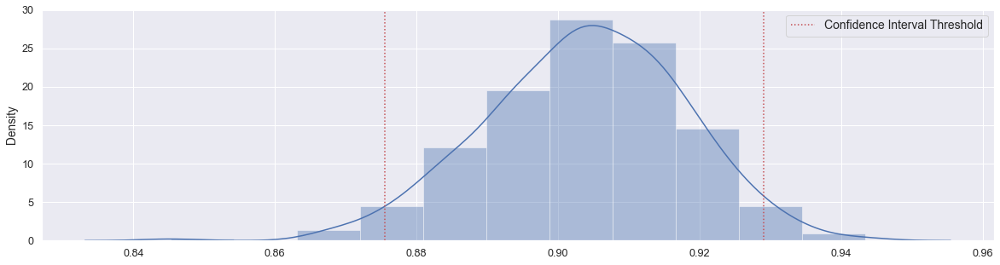

In [134]:
# Plot confidence Interval
plt.figure(figsize=(20,5))
# plt.hist(stats)
sns.distplot(stats, bins=11)
alpha = 0.95                             # for 95% confidence interval
p = ((1.0-alpha)/2.0) * 100              # tail regions on right and left .25 on each side indicated by P value (border)
lower = max(0.0, np.percentile(stats, p))  
p = (alpha+((1.0-alpha)/2.0)) * 100
upper = min(1.0, np.percentile(stats, p))
plt.axvline(x=lower, color='r', linestyle=':')
plt.axvline(x=upper, color='r', linestyle=':', label='Confidence Interval Threshold')
plt.legend(loc="best",prop={"size":14})
print("With %.1f confidence interval, Gradient Boosting's score varies between %.1f%% and %.1f%%" % 
      (alpha*100, lower*100, upper*100))

With 100 samples, 95.0 confidence interval, Gradient Boosting's score varies between 88.4% and 93.1%

## Model Building with Feature Extraction using PCA

In [135]:
from sklearn.decomposition import PCA

In [136]:
concrete_df_pca = concrete_df_scaled.copy()
concrete_df_pca

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
0,-1.316792,1.625450,-0.865375,1.011058,-1.019640,-0.033232,-0.300903,-0.280312,-0.329328
1,-1.052152,-0.346513,1.071486,-1.118210,0.805602,1.372475,0.295376,-0.500082,-0.721299
2,-0.274530,-0.836600,0.625836,0.252624,-0.090119,-0.225388,1.107915,-0.280312,-0.370491
3,-0.121115,0.487332,-0.865375,2.165196,-1.019640,-0.546508,-1.282201,-0.280312,0.651214
4,-1.187348,1.293305,-0.865375,0.530559,0.518296,0.941736,-0.948435,-0.280312,-1.042003
...,...,...,...,...,...,...,...,...,...
1000,-1.377199,-0.836600,1.721261,-0.095973,0.670399,-0.172513,0.405381,-0.280312,-1.349190
1001,2.422696,-0.836600,-0.865375,-1.895487,3.746272,-1.576930,1.514185,-0.672758,0.371673
1002,-0.021395,0.510559,0.541693,-0.114816,0.484495,-1.344795,-0.053391,-0.280312,0.554757
1003,0.607606,-0.395289,-0.865375,2.165196,-1.019640,-0.546508,-1.282201,3.518569,1.217053


In [137]:
# Initialize and fit pca
# Create a covariance matrix and calculate eigen values

from sklearn.decomposition import PCA

pca = PCA().fit(concrete_df_pca.drop('strength', axis=1))

In [138]:
# cumulative sum of variance explained with [n] features

eigen_vals = np.round(pca.explained_variance_ratio_, decimals=3)*100
np.cumsum(eigen_vals)

array([ 28.9,  46.8,  62.7,  75.4,  87.5,  97.4,  99.7, 100.1])

In [139]:
print(pca.explained_variance_)

[2.3167244  1.42954966 1.27424916 1.01951439 0.965089   0.79009848
 0.18230082 0.03044223]


In [140]:
print(pca.components_)

[[ 1.24183437e-01  1.91463250e-01 -4.17873630e-01  5.40839606e-01
  -4.95647202e-01  1.07346879e-02 -3.90070031e-01  2.87851414e-01]
 [ 4.54065965e-01 -6.80018797e-01 -6.01801177e-02 -1.41644602e-01
  -1.61327738e-01  5.08409258e-01  1.00108246e-02  1.52009427e-01]
 [ 6.97847284e-01  9.83234373e-02 -3.47500758e-01 -1.59781207e-01
   3.73585911e-01 -4.62950407e-01 -5.35511152e-02  1.72518057e-02]
 [-6.53587720e-02 -3.82454858e-01  2.19700151e-01  2.95878061e-01
  -6.34455380e-02 -5.26418570e-01  4.11215176e-01  5.13229735e-01]
 [ 8.52686836e-02 -4.14459905e-02  5.78658935e-01  9.73473154e-02
   3.19891253e-01 -5.64997738e-04 -6.88038081e-01  2.66386346e-01]
 [-1.72207747e-01  3.10648314e-01 -2.18212841e-01 -3.70714793e-01
   2.08859474e-01  2.81804530e-01  1.08988700e-01  7.44231956e-01]
 [ 2.23156228e-01  2.31634217e-01  3.55442540e-01 -5.26719628e-01
  -6.59861368e-01 -2.24545888e-01 -4.02645301e-02  7.29027368e-02]
 [ 4.47677355e-01  4.39434280e-01  3.79384558e-01  3.87318916e-01
   

In [141]:
# calculate variance ratios
var = pca.explained_variance_ratio_;var

array([0.2893024 , 0.1785159 , 0.15912266, 0.12731249, 0.12051609,
       0.09866404, 0.02276493, 0.00380149])

Text(0.5, 0, 'Number of components')

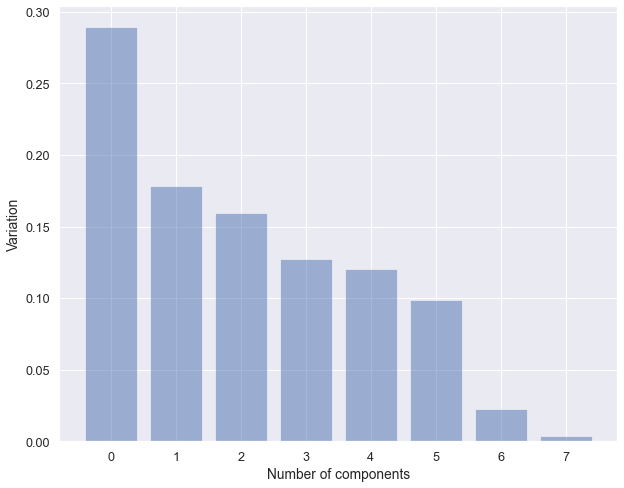

In [142]:
# Visualize the contribution of variance of each attribute

plt.figure(figsize=(10,8))
plt.bar(list(range(8)),pca.explained_variance_ratio_,alpha=0.5, align='center');
plt.ylabel('Variation')
plt.xlabel('Number of components')

Text(0.5, 0, 'Number of components')

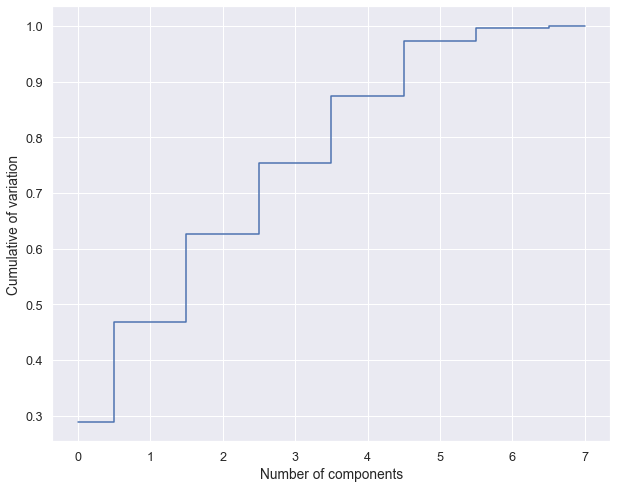

In [143]:
# 6 attributes explaines 95% of variance overall

plt.figure(figsize=(10,8))
plt.step(list(range(8)),np.cumsum(pca.explained_variance_ratio_), where='mid');
plt.ylabel('Cumulative of variation')
plt.xlabel('Number of components')

There are 6 features which explains more than 95% of variance cumulatively in the dataset

In [144]:
# Create a new matrix using the n components
X = concrete_df_pca.drop('strength', axis=1)
X_proj = PCA(n_components=6).fit_transform(X)

y = concrete_df_pca['strength']
X_proj.shape

(1005, 6)

In [145]:
# Divide the original and the projected dataset into 70:30 ration for train and test

X_proj_train, X_proj_test, y_train, y_test = train_test_split(X_proj, y, test_size=0.3, random_state=1)

### Linear Regression

In [146]:
linreg = LinearRegression()

In [147]:
linreg_scores = cross_val_score(linreg, X_proj_train, y_train, cv=KFold(10, random_state = 1,shuffle = True),scoring='neg_mean_squared_error')
linreg.fit(X_proj_train, y_train) 
print(linreg.coef_)
print()

# Calculate the score of Linear Regression
print('Training score  :', linreg.score(X_proj_train, y_train))
print('Testing score   :', linreg.score(X_proj_test, y_test))

# Calculate average RMSE
print('RMSE:',np.sqrt(-(linreg_scores)).mean())

[-0.02065792  0.09481563  0.52776664 -0.02066847  0.28200459  0.39944147]

Training score  : 0.5650280718176106
Testing score   : 0.4996458282859756
RMSE: 0.6833569548591526


### Decision Tree with K-fold cross validation

In [148]:
dtree = DecisionTreeRegressor(random_state=1)
dtree_scores = cross_val_score(dtree, X_proj_train, y_train, cv=KFold(10, random_state = 1,shuffle = True), scoring='neg_mean_squared_error')
dtree.fit(X_proj_train, y_train)

DecisionTreeRegressor(random_state=1)

In [149]:
#Making the prediction
y_predict = dtree.predict(X_proj_test)

In [150]:
# Calculate the score of Decision Tree Regressor

print('Training Score:',dtree.score(X_proj_train,y_train))
print('Testing Score:',dtree.score(X_proj_test,y_test))
# calculate the average RMSE
print('RMSE:',np.sqrt(-(dtree_scores)).mean())

Training Score: 0.9959463679857884
Testing Score: 0.46530714468428636
RMSE: 0.6547927423806577


### Random Forest with K-fold cross validation

In [151]:
rforest = RandomForestRegressor(random_state=1)
rforest_scores = cross_val_score(rforest, X_proj_train, y_train, cv=KFold(10, random_state = 1,shuffle = True), scoring='neg_mean_squared_error')
rforest = rforest.fit(X_proj_train, y_train)

In [152]:
y_predict = rforest.predict(X_proj_test)

In [153]:
# Calculate the score of Random Forest Regressor

print('Training Score:',rforest.score(X_proj_train,y_train))
print('Testing Score:',rforest.score(X_proj_test,y_test))
# calculate the average RMSE
print('RMSE:',np.sqrt(-(rforest_scores)).mean())

Training Score: 0.9656212067972886
Testing Score: 0.7067968679963896
RMSE: 0.4928863948789588


### Gradient Boost with K-fold cross validation

In [154]:
gboost = GradientBoostingRegressor(random_state=1)
gboost_scores = cross_val_score(gboost, X_proj_train, y_train, cv=KFold(10, random_state = 1,shuffle = True), scoring='neg_mean_squared_error')
gboost = gboost.fit(X_proj_train, y_train)

In [155]:
y_predict = gboost.predict(X_proj_test)

In [156]:
# Calculate the score of Gradient Boost Regressor

print('Training Score:',gboost.score(X_proj_train,y_train))
print('Testing Score:',gboost.score(X_proj_test,y_test))
# calculate the average RMSE
print('RMSE:',np.sqrt(-(gboost_scores)).mean())

Training Score: 0.8948215784972031
Testing Score: 0.6802658710679268
RMSE: 0.5163251784901031


It looks like all the regressors tried above with PCA performed very poorly in terms of training and test scores and with high RMSE scores on PCA projected dataset and as such are able to predict the compressive strength of the cement with an acceptable accuracy.

## Model Building with Feature Generation using Polynomial Features

In [157]:
from sklearn.preprocessing import PolynomialFeatures

In [158]:
concrete_df_poly = concrete_df_new.copy()
concrete_df_poly

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
0,141.3,212.0,0.0,203.5,0.0,971.8,748.5,28,29.89
1,168.9,42.2,124.3,158.3,10.8,1080.8,796.2,14,23.51
2,250.0,0.0,95.7,187.4,5.5,956.9,861.2,28,29.22
3,266.0,114.0,0.0,228.0,0.0,932.0,670.0,28,45.85
4,154.8,183.4,0.0,193.3,9.1,1047.4,696.7,28,18.29
...,...,...,...,...,...,...,...,...,...
1025,135.0,0.0,166.0,180.0,10.0,961.0,805.0,28,13.29
1026,531.3,0.0,0.0,141.8,28.2,852.1,893.7,3,41.30
1027,276.4,116.0,90.3,179.6,8.9,870.1,768.3,28,44.28
1028,342.0,38.0,0.0,228.0,0.0,932.0,670.0,270,55.06


In [159]:
# Instantiate an poly object with 2nd degree
poly = PolynomialFeatures(degree=2, interaction_only=True)

In [160]:
# Fit and transform the X or input features
concrete_df_poly = poly.fit_transform(concrete_df_poly.drop('strength', axis=1))

In [161]:
# Get the shape of the newly generated features
print("Number of rows    :",concrete_df_poly.shape[0])
print("Number of columns :",concrete_df_poly.shape[1])

Number of rows    : 1005
Number of columns : 37


In [162]:
# Join the strength column to create a polynomial dataset
concrete_df_poly = pd.DataFrame(concrete_df_poly,columns=poly.get_feature_names())
concrete_df_poly['strength'] = concrete_df_new['strength']
concrete_df_poly.shape

(1005, 38)

<AxesSubplot:>

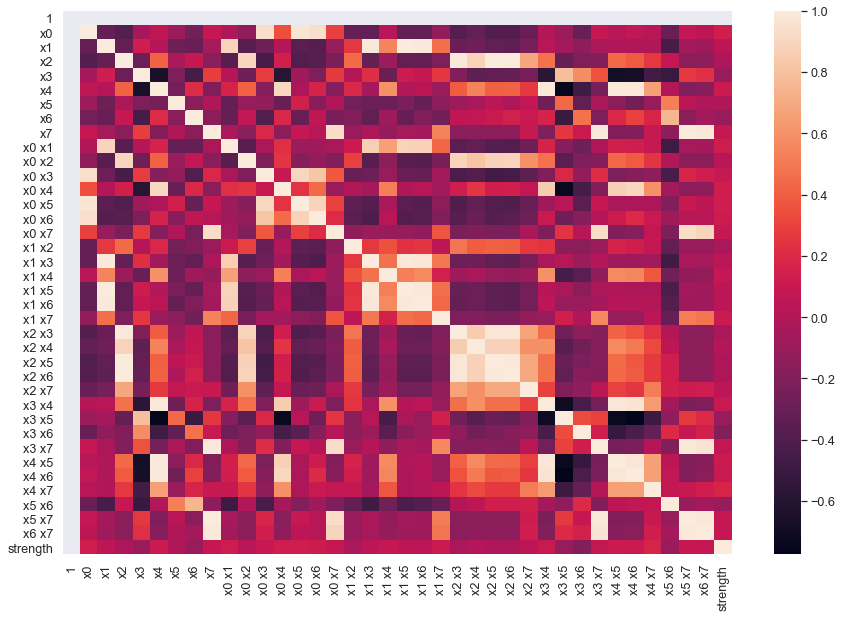

In [163]:
# Visualize the correlation matrix
plt.figure(figsize=(15,10))
sns.heatmap(concrete_df_poly.corr())

In [164]:
x = concrete_df_poly.corr()['strength']
upper_limit = 0.6
lower_limit = -0.5
fltr = list(map(lambda x: True if(x >= upper_limit or x <= lower_limit) else False, x))
x[fltr].sort_values()

strength    1.0
Name: strength, dtype: float64

This polynomial features dataset (with a degree 2) has very less correlationship coming out among all the features and with the strength column indicating that  no newly generated features are a very good strong predictor for compressive strength. All have a coefficient less than or close to 0.5. 

## Model Building with Automatic Feature Engineering 

In [165]:
# Import package
import featuretools as ft

In [166]:
ft.list_primitives().tail(30)

,name,type,dask_compatible,koalas_compatible,description
49,modulo_by_feature,transform,True,True,Return the modulo of a scalar by each element ...
50,haversine,transform,False,False,Calculates the approximate haversine distance ...
51,scalar_subtract_numeric_feature,transform,True,True,Subtract each value in the list from a given s...
52,latitude,transform,False,False,Returns the first tuple value in a list of Lat...
53,minute,transform,True,True,Determines the minutes value of a datetime.
54,not_equal_scalar,transform,True,True,Determines if values in a list are not equal t...
55,equal_scalar,transform,True,True,Determines if values in a list are equal to a ...
56,not,transform,True,True,Negates a boolean value.
57,hour,transform,True,True,Determines the hour value of a datetime.
58,modulo_numeric_scalar,transform,True,True,Return the modulo of each element in the list ...


In [167]:
# initialize entityset
es = ft.EntitySet(id = 'concrete_entitySet')

In [168]:
concrete_df_new

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
0,141.3,212.0,0.0,203.5,0.0,971.8,748.5,28,29.89
1,168.9,42.2,124.3,158.3,10.8,1080.8,796.2,14,23.51
2,250.0,0.0,95.7,187.4,5.5,956.9,861.2,28,29.22
3,266.0,114.0,0.0,228.0,0.0,932.0,670.0,28,45.85
4,154.8,183.4,0.0,193.3,9.1,1047.4,696.7,28,18.29
...,...,...,...,...,...,...,...,...,...
1025,135.0,0.0,166.0,180.0,10.0,961.0,805.0,28,13.29
1026,531.3,0.0,0.0,141.8,28.2,852.1,893.7,3,41.30
1027,276.4,116.0,90.3,179.6,8.9,870.1,768.3,28,44.28
1028,342.0,38.0,0.0,228.0,0.0,932.0,670.0,270,55.06


In [171]:
# initialize entity
es.entity_from_dataframe(entity_id = 'concrete_entity_id', index = 'id',dataframe = concrete_df_new,  make_index = True)

Entityset: concrete_entitySet
  Entities:
    concrete_entity_id [Rows: 1005, Columns: 10]
  Relationships:
    No relationships

In [172]:
es['concrete_entity_id'].df

,id,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
0,0,141.3,212.0,0.0,203.5,0.0,971.8,748.5,28,29.89
1,1,168.9,42.2,124.3,158.3,10.8,1080.8,796.2,14,23.51
2,2,250.0,0.0,95.7,187.4,5.5,956.9,861.2,28,29.22
3,3,266.0,114.0,0.0,228.0,0.0,932.0,670.0,28,45.85
4,4,154.8,183.4,0.0,193.3,9.1,1047.4,696.7,28,18.29
...,...,...,...,...,...,...,...,...,...,...
1000,1000,135.0,0.0,166.0,180.0,10.0,961.0,805.0,28,13.29
1001,1001,531.3,0.0,0.0,141.8,28.2,852.1,893.7,3,41.30
1002,1002,276.4,116.0,90.3,179.6,8.9,870.1,768.3,28,44.28
1003,1003,342.0,38.0,0.0,228.0,0.0,932.0,670.0,270,55.06


In [173]:
es['concrete_entity_id']

Entity: concrete_entity_id
  Variables:
    id (dtype: index)
    cement (dtype: numeric)
    slag (dtype: numeric)
    ash (dtype: numeric)
    water (dtype: numeric)
    superplastic (dtype: numeric)
    coarseagg (dtype: numeric)
    fineagg (dtype: numeric)
    age (dtype: numeric)
    strength (dtype: numeric)
  Shape:
    (Rows: 1005, Columns: 10)

In [174]:
concrete_new_features, feature_defs = ft.dfs(entityset = es, target_entity = 'concrete_entity_id',
                                             trans_primitives = ['add_numeric_scalar', 'multiply_numeric','divide_numeric'])
concrete_new_features.head()

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength,age + 0,...,fineagg * slag,fineagg * strength,fineagg * superplastic,fineagg * water,slag * strength,slag * superplastic,slag * water,strength * superplastic,strength * water,superplastic * water
id,,,,,,,,,,,,,,,,,,,,,
0,141.3,212.0,0.0,203.5,0.0,971.8,748.5,28,29.89,28,...,158682.00,22372.665,0.00,152319.75,6336.680,0.00,43142.00,0.000,6082.615,0.00
1,168.9,42.2,124.3,158.3,10.8,1080.8,796.2,14,23.51,14,...,33599.64,18718.662,8598.96,126038.46,992.122,455.76,6680.26,253.908,3721.633,1709.64
2,250.0,0.0,95.7,187.4,5.5,956.9,861.2,28,29.22,28,...,0.00,25164.264,4736.60,161388.88,0.000,0.00,0.00,160.710,5475.828,1030.70
3,266.0,114.0,0.0,228.0,0.0,932.0,670.0,28,45.85,28,...,76380.00,30719.500,0.00,152760.00,5226.900,0.00,25992.00,0.000,10453.800,0.00
4,154.8,183.4,0.0,193.3,9.1,1047.4,696.7,28,18.29,28,...,127774.78,12742.643,6339.97,134672.11,3354.386,1668.94,35451.22,166.439,3535.457,1759.03


<AxesSubplot:>

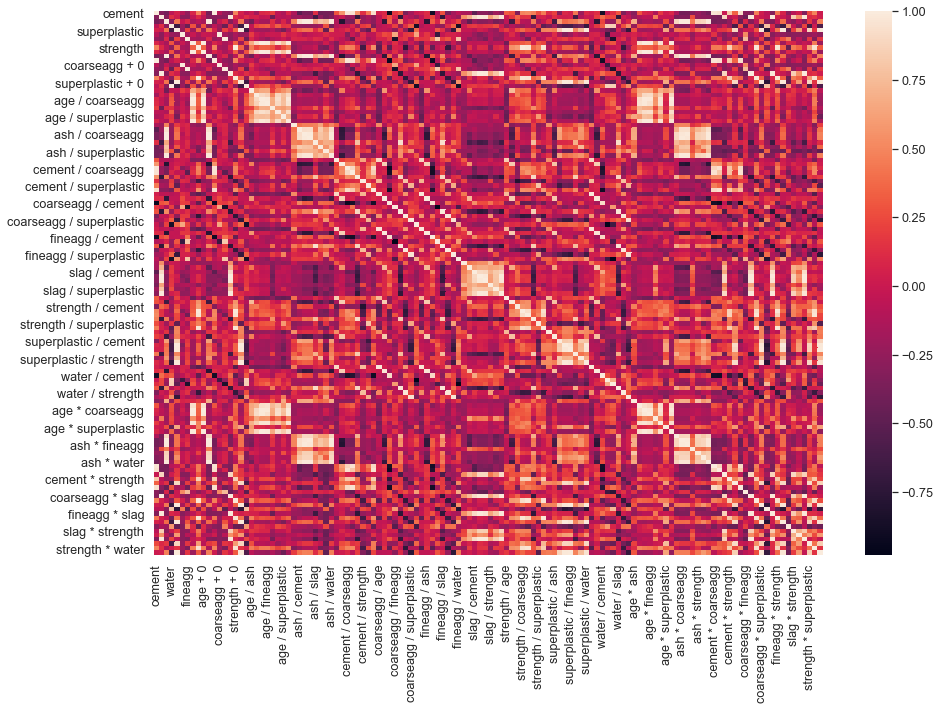

In [175]:
# Visualize the correlation matrix
plt.figure(figsize=(15,10))
sns.heatmap(concrete_new_features.corr())

In [176]:
# Correlation matrix 
corr = concrete_new_features.corr()
corr

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength,age + 0,...,fineagg * slag,fineagg * strength,fineagg * superplastic,fineagg * water,slag * strength,slag * superplastic,slag * water,strength * superplastic,strength * water,superplastic * water
cement,1.000000,-0.303370,-0.385610,-0.055785,0.060906,-0.086205,-0.247662,0.086348,0.488283,0.086348,...,-0.316443,0.430051,0.068754,-0.296956,-0.079765,0.025453,-0.325367,0.244908,0.483386,0.015378
slag,-0.303370,1.000000,-0.312365,0.130134,0.019879,-0.277595,-0.291129,-0.042737,0.103412,-0.042737,...,0.989962,0.046173,-0.009537,-0.134379,0.848063,0.547443,0.990895,0.097741,0.135273,0.032243
ash,-0.385610,-0.312365,1.000000,-0.285469,0.414213,-0.026468,0.091873,-0.158940,-0.080648,-0.158940,...,-0.323085,-0.049053,0.386434,-0.193791,-0.288169,-0.087398,-0.310448,0.166125,-0.149861,0.472159
water,-0.055785,0.130134,-0.285469,1.000000,-0.650000,-0.210771,-0.442960,0.281111,-0.270347,0.281111,...,0.088999,-0.393051,-0.667879,0.577841,-0.005863,-0.295756,0.222330,-0.620440,0.024268,-0.572017
superplastic,0.060906,0.019879,0.414213,-0.650000,1.000000,-0.241721,0.204485,-0.194076,0.344209,-0.194076,...,0.040305,0.419577,0.990005,-0.474040,0.189933,0.591994,-0.048787,0.886296,0.152133,0.985486
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
slag * superplastic,0.025453,0.547443,-0.087398,-0.295756,0.591994,-0.286797,-0.073946,-0.114905,0.349405,-0.114905,...,0.564326,0.346803,0.550259,-0.356276,0.683008,1.000000,0.467032,0.628345,0.256944,0.594060
slag * water,-0.325367,0.990895,-0.310448,0.222330,-0.048787,-0.285241,-0.328973,-0.013752,0.066088,-0.013752,...,0.973049,-0.001481,-0.077522,-0.081373,0.814282,0.467032,1.000000,0.023254,0.126215,-0.029679
strength * superplastic,0.244908,0.097741,0.166125,-0.620440,0.886296,-0.248904,0.162336,-0.079945,0.604915,-0.079945,...,0.120264,0.673026,0.881556,-0.484214,0.347619,0.628345,0.023254,1.000000,0.408037,0.840963
strength * water,0.483386,0.135273,-0.149861,0.024268,0.152133,-0.200654,-0.343680,0.454523,0.949646,0.454523,...,0.117017,0.871321,0.134720,-0.309804,0.456275,0.256944,0.126215,0.408037,1.000000,0.148857


In [177]:
concrete_new_features

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength,age + 0,...,fineagg * slag,fineagg * strength,fineagg * superplastic,fineagg * water,slag * strength,slag * superplastic,slag * water,strength * superplastic,strength * water,superplastic * water
id,,,,,,,,,,,,,,,,,,,,,
0,141.3,212.0,0.0,203.5,0.0,971.8,748.5,28,29.89,28,...,158682.00,22372.665,0.00,152319.75,6336.680,0.00,43142.00,0.000,6082.615,0.00
1,168.9,42.2,124.3,158.3,10.8,1080.8,796.2,14,23.51,14,...,33599.64,18718.662,8598.96,126038.46,992.122,455.76,6680.26,253.908,3721.633,1709.64
2,250.0,0.0,95.7,187.4,5.5,956.9,861.2,28,29.22,28,...,0.00,25164.264,4736.60,161388.88,0.000,0.00,0.00,160.710,5475.828,1030.70
3,266.0,114.0,0.0,228.0,0.0,932.0,670.0,28,45.85,28,...,76380.00,30719.500,0.00,152760.00,5226.900,0.00,25992.00,0.000,10453.800,0.00
4,154.8,183.4,0.0,193.3,9.1,1047.4,696.7,28,18.29,28,...,127774.78,12742.643,6339.97,134672.11,3354.386,1668.94,35451.22,166.439,3535.457,1759.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1000,135.0,0.0,166.0,180.0,10.0,961.0,805.0,28,13.29,28,...,0.00,10698.450,8050.00,144900.00,0.000,0.00,0.00,132.900,2392.200,1800.00
1001,531.3,0.0,0.0,141.8,28.2,852.1,893.7,3,41.30,3,...,0.00,36909.810,25202.34,126726.66,0.000,0.00,0.00,1164.660,5856.340,3998.76
1002,276.4,116.0,90.3,179.6,8.9,870.1,768.3,28,44.28,28,...,89122.80,34020.324,6837.87,137986.68,5136.480,1032.40,20833.60,394.092,7952.688,1598.44


In [178]:
x = concrete_new_features.corr()['strength']
upper_limit = 0.6
lower_limit = -0.5
fltr = list(map(lambda x: True if(x >= upper_limit or x <= lower_limit) else False, x))
x[fltr].sort_values()

coarseagg / strength      -0.735143
water / strength          -0.708398
fineagg / strength        -0.706140
cement / strength         -0.632302
water / age               -0.524768
fineagg / age             -0.514842
coarseagg / age           -0.508473
strength * superplastic    0.604915
strength / cement          0.608776
cement * strength          0.865003
strength * water           0.949646
strength / water           0.962983
fineagg * strength         0.966584
strength / fineagg         0.966757
coarseagg * strength       0.979410
strength / coarseagg       0.980629
strength + 0               1.000000
strength                   1.000000
Name: strength, dtype: float64

Extracting the composite features from above which will work with strength and adding them to the dataset

In [179]:
cols = list(concrete_df_new.columns)
cols.remove('id')
cols

['cement',
 'slag',
 'ash',
 'water',
 'superplastic',
 'coarseagg',
 'fineagg',
 'age',
 'strength']

In [180]:
cols.append('water / age')
cols.append('fineagg / age')
cols.append('coarseagg / age')
print(cols)

['cement', 'slag', 'ash', 'water', 'superplastic', 'coarseagg', 'fineagg', 'age', 'strength', 'water / age', 'fineagg / age', 'coarseagg / age']


In [181]:
concrete_ft_eng = concrete_new_features[cols]
concrete_ft_eng

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength,water / age,fineagg / age,coarseagg / age
id,,,,,,,,,,,,
0,141.3,212.0,0.0,203.5,0.0,971.8,748.5,28,29.89,7.267857,26.732143,34.707143
1,168.9,42.2,124.3,158.3,10.8,1080.8,796.2,14,23.51,11.307143,56.871429,77.200000
2,250.0,0.0,95.7,187.4,5.5,956.9,861.2,28,29.22,6.692857,30.757143,34.175000
3,266.0,114.0,0.0,228.0,0.0,932.0,670.0,28,45.85,8.142857,23.928571,33.285714
4,154.8,183.4,0.0,193.3,9.1,1047.4,696.7,28,18.29,6.903571,24.882143,37.407143
...,...,...,...,...,...,...,...,...,...,...,...,...
1000,135.0,0.0,166.0,180.0,10.0,961.0,805.0,28,13.29,6.428571,28.750000,34.321429
1001,531.3,0.0,0.0,141.8,28.2,852.1,893.7,3,41.30,47.266667,297.900000,284.033333
1002,276.4,116.0,90.3,179.6,8.9,870.1,768.3,28,44.28,6.414286,27.439286,31.075000


In [182]:
std_scale = StandardScaler()
concrete_ft_scaled = pd.DataFrame(std_scale.fit_transform(concrete_ft_eng),columns = concrete_ft_eng.columns)

In [183]:
X = concrete_ft_scaled.drop(['strength'], axis=1)
Y = concrete_ft_scaled[['strength']]

In [184]:
# Split into training and test set
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3,random_state=1)

### Random Forest with K-fold cross validation

In [185]:
rforest = RandomForestRegressor(random_state=1)
rforest_scores = cross_val_score(rforest, X_train, y_train, cv=KFold(10, random_state = 1,shuffle = True), scoring='neg_mean_squared_error')
rforest = rforest.fit(X_train, y_train)

In [186]:
y_predict = rforest.predict(X_test)
# Calculate the score of Random Forest Regressor

print('Training Score:',rforest.score(X_train,y_train))
print('Testing Score:',rforest.score(X_test,y_test))
# calculate the average RMSE
print('RMSE:',np.sqrt(-(rforest_scores)).mean())

Training Score: 0.9820876477289735
Testing Score: 0.8638997717132928
RMSE: 0.3443635846359252


### Gradient Boost with K-fold cross validation

In [187]:
gboost = GradientBoostingRegressor(random_state=1)
gboost_scores = cross_val_score(gboost, X_train, y_train, cv=KFold(10, random_state = 1,shuffle = True), scoring='neg_mean_squared_error')
gboost = gboost.fit(X_train, y_train)

In [188]:
y_predict = gboost.predict(X_test)

In [189]:
# Calculate the score of Gradient Boost Regressor

print('Training Score:',gboost.score(X_train,y_train))
print('Testing Score:',gboost.score(X_test,y_test))
# calculate the average RMSE
print('RMSE:',np.sqrt(-(gboost_scores)).mean())

Training Score: 0.9545613911559598
Testing Score: 0.8874887227031611
RMSE: 0.3344237553436854


Random forest model seems to be highly overfit as there is quite a drop in the accuracy of the test set and Gradientboosregressor performs better than randomforst regressor and hence it can be further tuned to squeeze the extra performance

### Hyperparameter Tuning - GridSearchCV - Gradient Boost

In [190]:
n_estimators = [200, 300, 400, 500,1000]
learning_rate = [0.001,0.05,0.01,0.1]
max_depth = [8,10,20,30,40]
subsample = [0.5, 0.6, 0.8, 0.9, 1.0]

In [191]:
param_grid = dict(n_estimators = n_estimators, max_depth = max_depth,learning_rate = learning_rate,  
              subsample = subsample)

In [192]:
# Create grid search using 5-fold cross validation
clf = GridSearchCV(gboost, param_grid, cv=5, n_jobs = -1,verbose=2)

In [193]:
# Fit grid search
gboost_best_model = clf.fit(X_train, y_train)

Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   18.9s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 640 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 1005 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done 1450 tasks      | elapsed: 21.5min
[Parallel(n_jobs=-1)]: Done 1977 tasks      | elapsed: 29.4min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed: 39.5min finished


In [194]:
# View best hyperparameters
training_score = gboost_best_model.best_score_
print(gboost_best_model.best_score_)

print(gboost_best_model.best_params_)

0.9125761029724755
{'learning_rate': 0.1, 'max_depth': 8, 'n_estimators': 300, 'subsample': 0.5}


In [195]:
# Actual model object fit with those best parameters
# Shows default parameters that we did not specify
print(gboost_best_model.best_estimator_)

GradientBoostingRegressor(max_depth=8, n_estimators=300, random_state=1,
                          subsample=0.5)


In [196]:
# Apply best params to fit this model and see training scores
clfg = gboost_best_model.best_estimator_
print("R Squared:",cross_val_score(clfg, X_train, y_train.values.ravel(), cv=10, scoring='r2').mean())

R Squared: 0.9090456207215493


In [197]:
clfg = clfg.fit(X_train, y_train.values.ravel())

In [198]:
test_RMSE = np.sqrt(mean_squared_error(y_test, clfg.predict(X_test)))
print("Test RMSE: ", np.sqrt(mean_squared_error(y_test, clfg.predict(X_test))))
test_score = r2_score(y_test, clfg.predict(X_test))
print("Test R^2: ", r2_score(y_test, clfg.predict(X_test)))

Test RMSE:  0.29103576339268966
Test R^2:  0.9034317641207235


In [199]:
#Bootstrap Sampling

from sklearn.utils import resample

values = concrete_ft_scaled.values
n_iterations = 500        # Number of bootstrap samples to create
n_size = int(len(concrete_ft_scaled))    # size of a bootstrap sample
# run bootstrap
stats = list()   # empty list that will hold the scores for each bootstrap iteration
for i in range(n_iterations):
    # prepare train and test sets
    train = resample(values, n_samples=n_size)  # Sampling with replacement 
    # picking rest of the data not considered in sample
    test = np.array([x for x in values if x.tolist() not in train.tolist()])  
    
    # fit model
    gboost_boot = gboost_best_model.best_estimator_
    gboost_boot.fit(train[:,:-1], train[:,-1])   # fit against independent variables and corresponding target values
    y_test = test[:,-1]    # Take the target column for all rows in test set

    # evaluate model
    predictions = gboost_boot.predict(test[:, :-1])   # predict based on independent variables in the test data
    score = gboost_boot.score(test[:, :-1] , y_test)
    stats.append(score)

With 95.0 confidence interval, Gradient Boosting's score varies between 82.0% and 100.0%


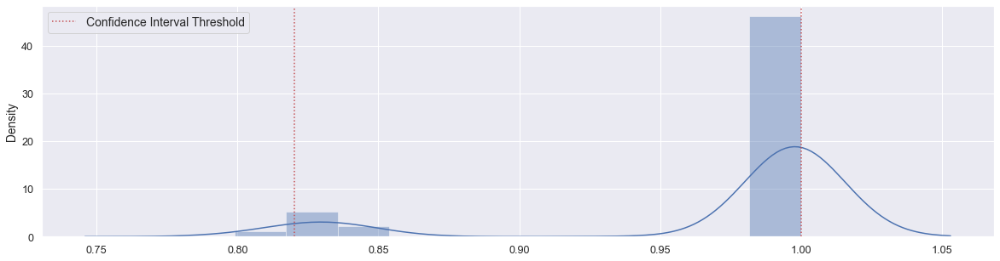

In [200]:
# Plot confidence Interval
plt.figure(figsize=(20,5))
# plt.hist(stats)
sns.distplot(stats, bins=11)
alpha = 0.95                             # for 95% confidence interval
p = ((1.0-alpha)/2.0) * 100              # tail regions on right and left .25 on each side indicated by P value (border)
lower = max(0.0, np.percentile(stats, p))  
p = (alpha+((1.0-alpha)/2.0)) * 100
upper = min(1.0, np.percentile(stats, p))
plt.axvline(x=lower, color='r', linestyle=':')
plt.axvline(x=upper, color='r', linestyle=':', label='Confidence Interval Threshold')
plt.legend(loc="best",prop={"size":14})
print("With %.1f confidence interval, Gradient Boosting's score varies between %.1f%% and %.1f%%" % 
      (alpha*100, lower*100, upper*100))